<a href="https://colab.research.google.com/github/YUFULEO/Random-Graphs-and-Random-Walks/blob/main/ECE_232E_Project1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 1：Generating Random Networks

## 1. Create random networks using Erd ̈os-R ́enyi (ER) model

### Question 1(a)

In [ ]:
!pip install cairocffi
!pip install igraph

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.1/75.1 kB 787.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 8.9 MB/s eta 0:00:00


In [ ]:
import cairocffi
import igraph as ig
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as widgets
from IPython.display import display, Image
import os
from sklearn.linear_model import LinearRegression

probability p: 0.002: degree mean = 1.8977777777777778, degree variance = 1.8651061728395062
Theoretical values: E[X] = (n-1)p = 1.798, Var(X) = (n-1)p(1-p) = 1.794404


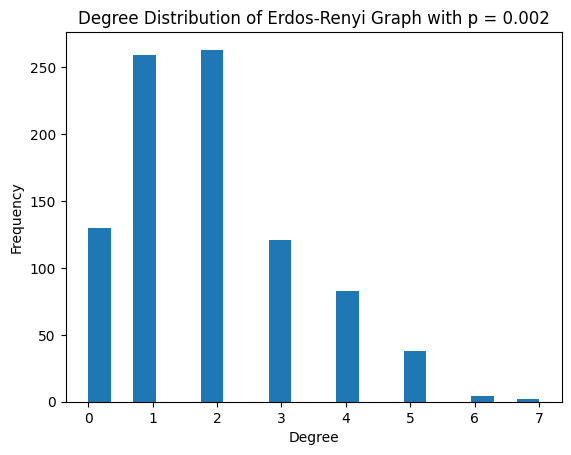

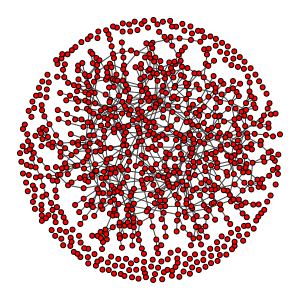

probability p: 0.006: degree mean = 5.408888888888889, degree variance = 5.430587654320988
Theoretical values: E[X] = (n-1)p = 5.394, Var(X) = (n-1)p(1-p) = 5.361636


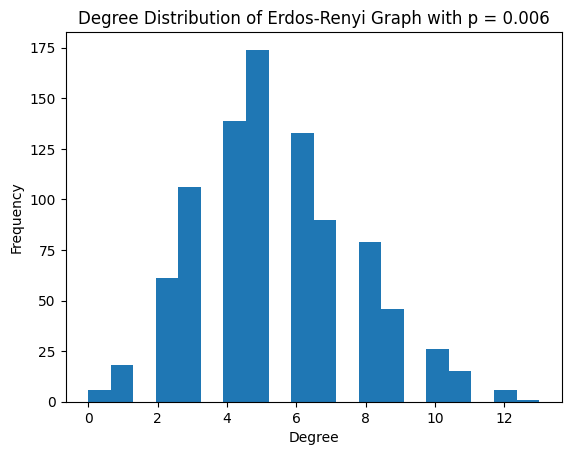

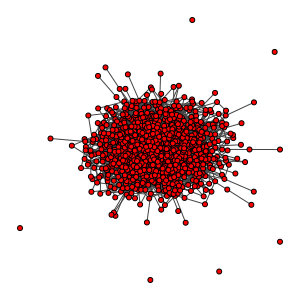

probability p: 0.012: degree mean = 10.826666666666666, degree variance = 10.1744
Theoretical values: E[X] = (n-1)p = 10.788, Var(X) = (n-1)p(1-p) = 10.658544000000001


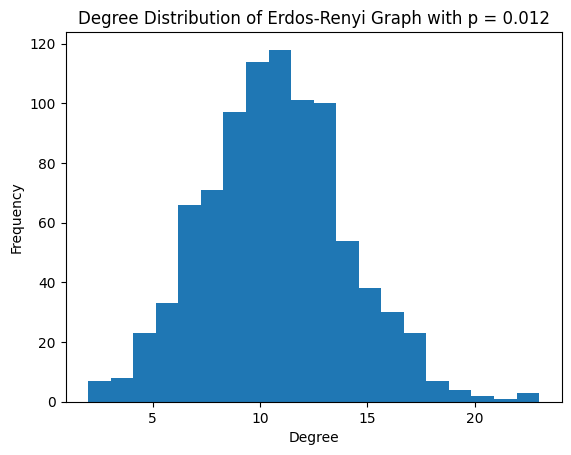

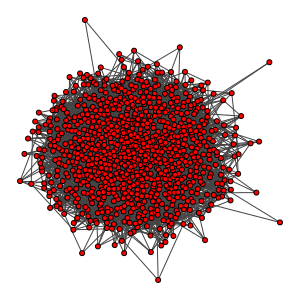

probability p: 0.045: degree mean = 40.77777777777778, degree variance = 41.60395061728395
Theoretical values: E[X] = (n-1)p = 40.455, Var(X) = (n-1)p(1-p) = 38.634525


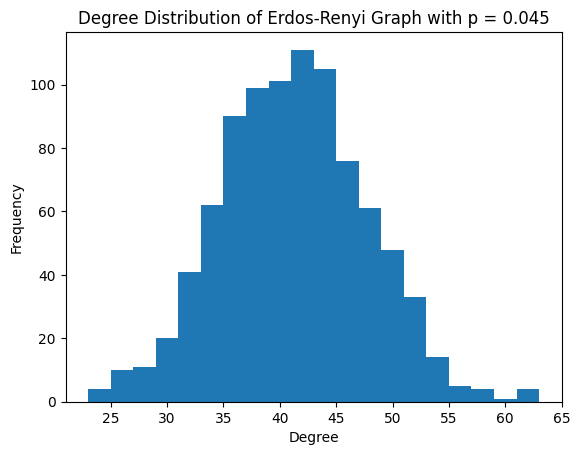

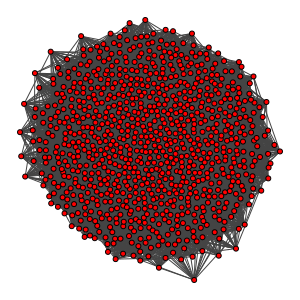

probability p: 0.1: degree mean = 90.49555555555555, degree variance = 76.33220246913581
Theoretical values: E[X] = (n-1)p = 89.9, Var(X) = (n-1)p(1-p) = 80.91000000000001


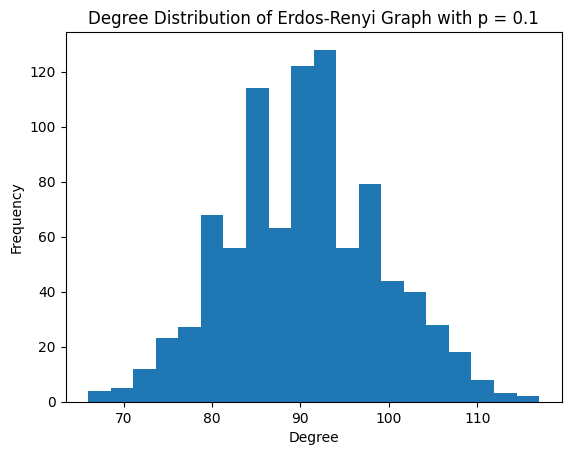

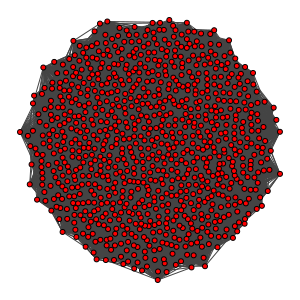

In [ ]:
p_ls = [0.002, 0.006, 0.012, 0.045, 0.1]
for p in p_ls:
  g = ig.Graph.Erdos_Renyi(n = 900, p = p)
  d = g.degree()
  print(f'probability p: {p}: degree mean = {np.mean(d)}, degree variance = {np.var(d)}')
  print(f'Theoretical values: E[X] = (n-1)p = {(900-1) * p}, Var(X) = (n-1)p(1-p) = {(900-1) * p * (1-p)}')
  plt.hist(d, bins=20, log=False)
  plt.xlabel('Degree')
  plt.ylabel('Frequency')
  plt.title(f'Degree Distribution of Erdos-Renyi Graph with p = {p}')
  plt.show()
  plot_path = f"/content/graph_plot_{p}.png"
  ig.plot(g, plot_path, bbox=(300, 300), margin=20, vertex_size=5)

  display(Image(filename=plot_path))
  os.remove(plot_path)

**<font color=blue size=4>Question 1(a)**

**Create undirected random networks with n = 900 nodes, and the probability p for drawing an edge between two arbitrary vertices 0.002, 0.006, 0.012, 0.045, and 0.1. Plot the degree distributions. What distribution (linear/exponential/gaussian/binomial or something else) is observed? Explain why. Also, report the mean and variance of the degree distributions and compare them to the theoretical values.**

We creat undirected random networks with n = 900 nodes, and the probability p for drawing an edge between two arbitrary vertices 0.002, 0.006, 0.012, 0.045, and 0.1. We also plot the degree distributions. You can see the plots above. The binomial distribution is observed. Because in the ER model, each conceivable edge between two nodes is given a predetermined probability p, regardless of other edges. Also, each node has n-1 edges that can link to other n-1 nodes. And a node's degree is determined by the sum of n−1 independent Bernoulli trials with success probability p. The probability that a fixed node has k edges (degree k) follows a binomial distribution:

$P(\text{degree} = k) = \binom{n-1}{k} p^k (1-p)^{n-1-k}$

Therefore, the binomial distribution is observed.

For p = 0.002


*   Degree mean = 1.8977777777777778
*   Degree variance = 1.8651061728395062
*   Theoretical mean = 1.798
*   Theoretical variance = 1.794404

For p = 0.006


*   Degree mean = 5.408888888888889
*   Degree variance = 5.430587654320988
*   Theoretical mean = 5.394
*   Theoretical variance = 5.361636

For p = 0.012


*   Degree mean = 10.826666666666666
*   Degree variance = 10.1744
*   Theoretical mean = 10.788
*   Theoretical variance = 10.658544000000001

For p = 0.045

*   Degree mean = 40.77777777777778
*   Degree variance = 41.60395061728395
*   Theoretical mean = 40.455
*   Theoretical variance = 38.634525


For p = 0.1


*   Degree mean = 90.49555555555555
*   Degree variance = 76.33220246913581
*   Theoretical mean = 89.9
*   Theoretical variance = 80.91000000000001




### Question 1(b)

In [ ]:
n = 900
p_ls = [0.002, 0.006, 0.012, 0.045, 0.1]
num_simulations = 1000

for p in p_ls:
    connected_count = 0
    diameters = []

    for _ in range(num_simulations):
        g = ig.Graph.Erdos_Renyi(n=n, p=p)
        if g.is_connected():
            connected_count += 1
        else:
            gcc = g.connected_components().giant()
            diameters.append(gcc.diameter())

    connectivity_prob = connected_count / num_simulations
    print(f'For p={p}')
    print(f'Connectivity probability = {connectivity_prob}')

    if len(diameters) > 0:
        avg_diameter = np.mean(diameters)
        print(f'Average diameter of the GCC: {avg_diameter}')
        print("---------------------------------------------------------------------------")
    else:
        print(f'All graphs are connected, no GCC diameter to report.')
        print("---------------------------------------------------------------------------")

For p=0.002
Connectivity probability = 0.0
Average diameter of the GCC: 25.23
---------------------------------------------------------------------------
For p=0.006
Connectivity probability = 0.02
Average diameter of the GCC: 8.324489795918367
---------------------------------------------------------------------------
For p=0.012
Connectivity probability = 0.973
Average diameter of the GCC: 5.0
---------------------------------------------------------------------------
For p=0.045
Connectivity probability = 1.0
All graphs are connected, no GCC diameter to report.
---------------------------------------------------------------------------
For p=0.1
Connectivity probability = 1.0
All graphs are connected, no GCC diameter to report.
---------------------------------------------------------------------------


**<font color=blue size=4>Question 1(b)**

**For each p and n = 900, answer the following questions:**

**Are all random realizations of the ER network connected? Numerically estimate the
probability that a generated network is connected. For one instance of the networks
with that p, find the giant connected component (GCC) if not connected. What is
the diameter of the GCC?**

You can see the results above. For p=0.002 and n = 900, all random realizations of the ER network are not connected. The probability that a generated network is connected is 0.0. Because it is not connected, the diameter of the GCC is 25.23. For p=0.006 and n = 900, most of random realizations of the ER network are not connected. The probability that a generated network is connected is 0.02. Because it is not connected, the diameter of the GCC is 8.324489795918367. For p=0.012 and n = 900, most of random realizations of the ER network are connected. The probability that a generated network is connected is 0.973. But there are still some realizations of the ER network are not connected, so the diameter of the GCC is 5.0. For p=0.045 and n = 900, all of random realizations of the ER network are connected. The probability that a generated network is connected is 1.0. Because it is connected, the diameter of the GCC is not reported. For p=0.1 and n = 900, all of random realizations of the ER network are connected. The probability that a generated network is connected is 1.0. Because it is connected, the diameter of the GCC is not reported.    

### Question 1(c)

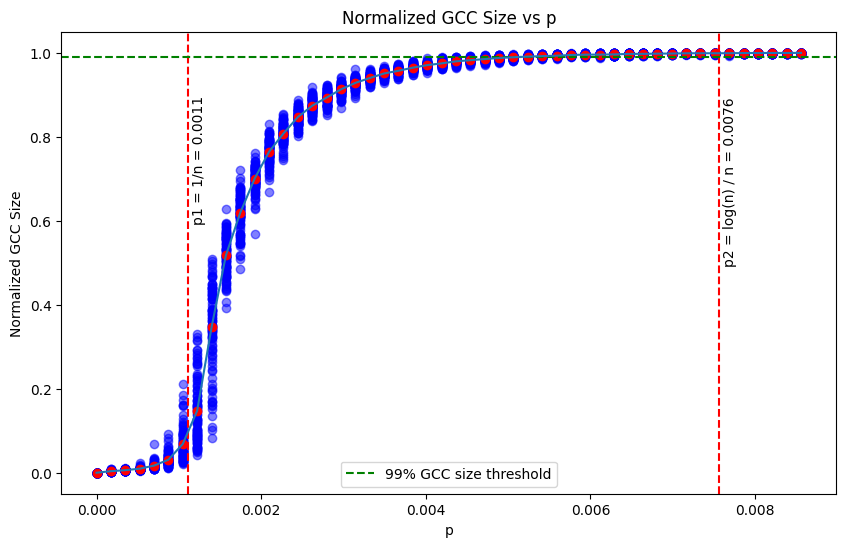

In [ ]:
n = 900
p1 = 1/n
p2 = np.log(n)/n
p_max = p2 + 0.001
p_values = np.linspace(0, p_max, 50)
num_simulations = 100

p_gcc_sizes = {p: [] for p in p_values}
size_means = []

for p in p_values:
  for _ in range(num_simulations):
    g = ig.Graph.Erdos_Renyi(n=n, p=p)
    gcc_size = len(g.connected_components().giant().vs)
    normalized_gcc_size = gcc_size / n
    p_gcc_sizes[p].append(normalized_gcc_size)

plt.figure(figsize=(10, 6))
for p, sizes in p_gcc_sizes.items():
  size_means.append(np.mean(sizes))
  plt.scatter([p] * len(sizes), sizes, color='blue', alpha=0.5)
  plt.plot(p, np.mean(sizes), 'ro')

plt.xlabel('p')
plt.ylabel('Normalized GCC Size')
plt.title('Normalized GCC Size vs p')
plt.axvline(x=p1, color='r', linestyle='--')
plt.text(p1 + 0.00005, 0.6, f'p1 = 1/n = {round(p1, 4)}', rotation=90)
plt.axvline(x=p2, color='r', linestyle='--')
plt.text(p2 + 0.00005, 0.5, f'p2 = log(n) / n = {round(p2, 4)}', rotation=90)
plt.axhline(0.99, color='green', linestyle='--', label='99% GCC size threshold')
plt.plot(p_values, size_means)
plt.legend()
plt.show()

In [ ]:
# i.
# We define the emergence of a giant connected component when the average GCC size exceeds 0.1.
for p, s in p_gcc_sizes.items():
  if np.mean(s) > 0.1:
    print(f'P value where the a GCC starts to emerge: {p}.')
    print(f'The theorectical value of p where a GCC starts to emerge: 1/n = {p1}')
    break

P value where the a GCC starts to emerge: 0.0012226023433848114.
The theorectical value of p where a GCC starts to emerge: 1/n = 0.0011111111111111111


In [ ]:
# ii.
for p, s in p_gcc_sizes.items():
  if np.percentile(s, 0) > 0.99:
    print(f'P value where every normalized GCC size > 0.99: {p}.')
    break

P value where every normalized GCC size > 0.99: 0.006287669194550459.


**<font color=blue size=4>Question 1(c)**

**It turns out that the normalized GCC size (i.e., the size of the GCC as a fraction of
the total network size) is a highly nonlinear function of p, with interesting properties
occurring for values where p = O(
1/
n
) and p = O(
ln n/
n
).
For n = 900, sweep over values of p from 0 to a pmax that makes the network almost
surely connected and create 100 random networks for each p. pmax should be roughly
determined by yourself. Then scatter plot the normalized GCC sizes vs p. Plot a line
of the average normalized GCC sizes for each p along with the scatter plot.**

**i. Empirically estimate the value of p where a giant connected component starts to
emerge (define your criterion of “emergence”)? Do they match with theoretical
values mentioned or derived in lectures?**

You can see the results above. We define the emergence of a giant connected component when the average GCC size exceeds 0.1. The P value where the GCC starts to emerge is 0.0012226023433848114. The theorectical value of p where a GCC starts to emerge: 1/n = 0.0011111111111111111. We find that they are closely matched.

**ii. Empirically estimate the value of p where the giant connected component takes
up over 99% of the nodes in almost every experiment.**

You can see the results above. We find that the P value where every normalized GCC size > 0.99 is 0.006287669194550459.

### Question 1(d)

In [ ]:
# i.
c = 0.5
num_simulations = 100
n_values = np.linspace(100, 10000, 100)
n_gcc_sizes = {n: [] for n in n_values}
for n in n_values:
  n = int(n)
  p = c / n
  for _ in range(num_simulations):
    g = ig.Graph.Erdos_Renyi(n=n, p=p)
    gcc_size = len(g.connected_components().giant().vs)
    n_gcc_sizes[n].append(gcc_size)

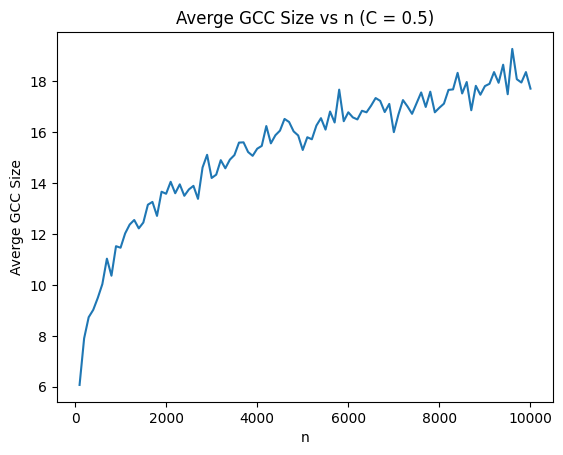

In [ ]:
plt.plot(n_values, [np.mean(s) for s in n_gcc_sizes.values()])
plt.xlabel('n')
plt.ylabel('Averge GCC Size')
plt.title('Averge GCC Size vs n (C = 0.5)')
plt.show()

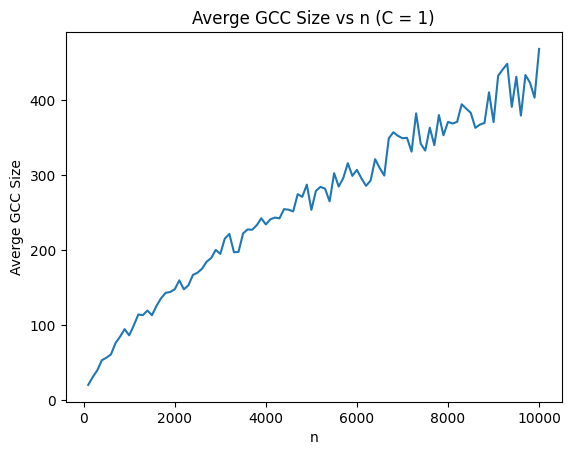

In [ ]:
# ii.
c = 1
num_simulations = 100
n_values = np.linspace(100, 10000, 100)
n_gcc_sizes = {n: [] for n in n_values}
for n in n_values:
  n = int(n)
  p = c / n
  for _ in range(num_simulations):
    g = ig.Graph.Erdos_Renyi(n=n, p=p)
    gcc_size = len(g.connected_components().giant().vs)
    n_gcc_sizes[n].append(gcc_size)

plt.plot(n_values, [np.mean(s) for s in n_gcc_sizes.values()])
plt.xlabel('n')
plt.ylabel('Averge GCC Size')
plt.title(f'Averge GCC Size vs n (C = {c})')
plt.show()

In [ ]:
# iii.
num_simulations = 100
n_values = np.linspace(100, 10000, 100)
n_gcc_sizes = {n: [] for n in n_values}
for n in n_values:
  n = int(n)
  for _ in range(num_simulations):
    g_1 = ig.Graph.Erdos_Renyi(n=n, p=1.15/n)
    gcc_size_1 = len(g_1.connected_components().giant().vs)
    g_2 = ig.Graph.Erdos_Renyi(n=n, p=1.25/n)
    gcc_size_2 = len(g_2.connected_components().giant().vs)
    g_3 = ig.Graph.Erdos_Renyi(n=n, p=1.35/n)
    gcc_size_3 = len(g_3.connected_components().giant().vs)
    n_gcc_sizes[n].append((gcc_size_1, gcc_size_2, gcc_size_3))

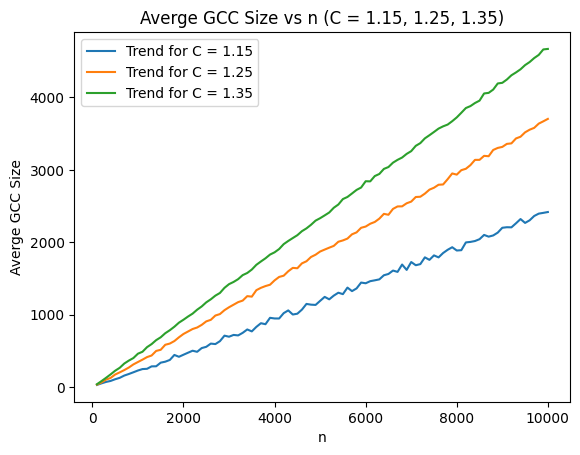

In [ ]:
sizes_1 = [[x[0] for x in sublist] for sublist in n_gcc_sizes.values()]
sizes_2 = [[x[1] for x in sublist] for sublist in n_gcc_sizes.values()]
sizes_3 = [[x[2] for x in sublist] for sublist in n_gcc_sizes.values()]

plt.xlabel('n')
plt.ylabel('Averge GCC Size')
plt.title(f'Averge GCC Size vs n (C = 1.15, 1.25, 1.35)')
plt.plot(n_values, [np.mean(x) for x in sizes_1], label = 'Trend for C = 1.15')
plt.plot(n_values, [np.mean(x) for x in sizes_2], label = 'Trend for C = 1.25')
plt.plot(n_values, [np.mean(x) for x in sizes_3], label = 'Trend for C = 1.35')
plt.legend()
plt.show()

**<font color=blue size=4>Question 1(d)**

**i. Define the average degree of nodes c = n × p = 0.5. Sweep over the number of
nodes, n, ranging from 100 to 10000. Plot the expected size of the GCC of ER
networks with n nodes and edge-formation probabilities p = c/n, as a function
of n. What trend is observed?**

We defined the average degree of nodes c = n × p = 0.5. Sweep over the number of nodes, n, ranging from 100 to 10000. Plot the expected size of the GCC of ER networks with n nodes and edge-formation probabilities p = c/n, as a function of n. You can see the plot above. There is a positive realtionship between n and average GCC sizes. When n increase, the average GCC sizes will also increase. But when n is large enough, the slop become smooth.

**ii. Repeat the same for c = 1.**

We repeated the same for c = 1. You can see the plot above. Also, there is a positive realtionship between n and average GCC sizes. When n increase, the average GCC sizes will also increase. But in this case, when n is large, the slope did not become smooth.

**iii. Repeat the same for values of c = 1.15, 1.25, 1.35, and show the results for these
three values in a single plot.**

We repeated the same for values of c = 1.15, 1.25, 1.35, and show the results for these three values in a single plot. You can see the plot above. Also, for each values of c, there is a positive realtionship between n and average GCC sizes. When n increase, the average GCC sizes will also increase.

**iv. What is the relation between the expected GCC size and n in each case?**

For c = 0.5, when n increase, the average GCC sizes will also increase. But when n is large enough, the slop become smooth. For c = 1, 1.15, 1.25, 1.35, When n increase, the average GCC sizes will also increase. In other words, expected GCC size become larger when c increase and n is the same, because p = c/n. When c is larger, p is larger, and more nodes are connected, and the GCC size is larger.


## 2. Create networks using preferential attachment model


### Question 2(a)

In [ ]:
all([ig.Graph.Barabasi(n=1050, m=1).is_connected() for _ in range(10000)])

True

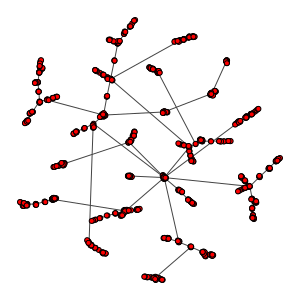

In [ ]:
g = ig.Graph.Barabasi(n=1050, m=1)
ig.plot(g, bbox=(300, 300), margin=20, vertex_size=5)

**<font color=blue size=4>Question 2(a)**

**Create an undirected network with n = 1050 nodes, with preferential attachment
model, where each new node attaches to m = 1 old nodes. Is such a network always
connected?**

We create an undirected network with n = 1050 nodes, with preferential attachment model, where each new node attaches to m = 1 old nodes. You can see the results above. We also plot the graph. Such a network is always connected.

### Question 2(b)

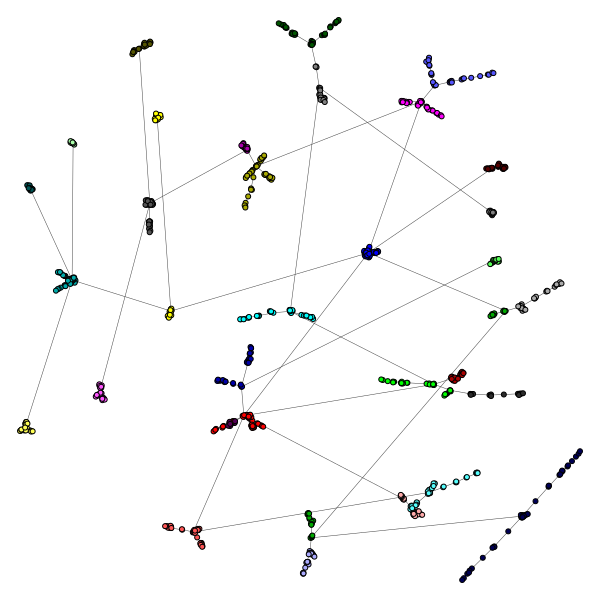

In [ ]:
g = ig.Graph.Barabasi(n=1050, m=1)
communities = g.community_fastgreedy()
clusters = communities.as_clustering()
modularity = clusters.modularity
community_sizes = clusters.sizes()
colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
g.vs['color'] = colors.get_many(clusters.membership)

visual_style = {
  "bbox": (600, 600),
  "margin": 20,
  "vertex_size": 5,
  "edge_width": 0.5,
  "vertex_color": g.vs['color']
}
ig.plot(g, **visual_style)

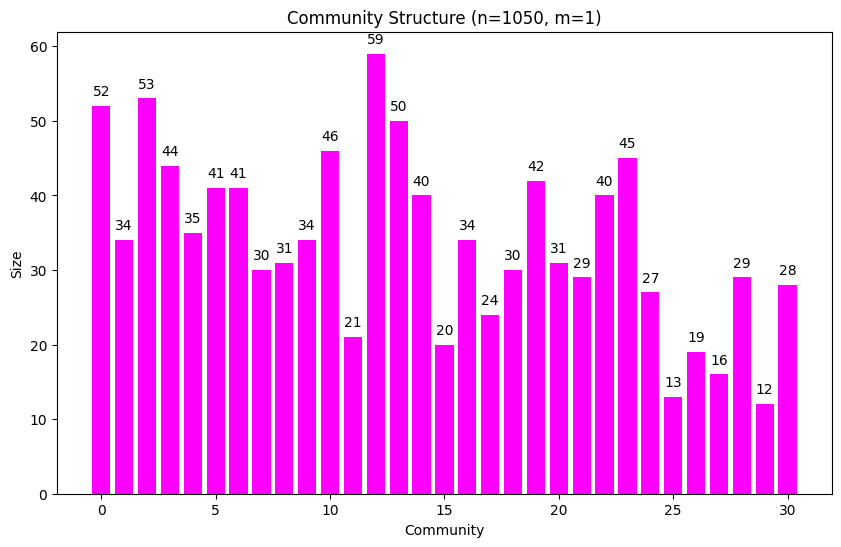

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(community_sizes)), community_sizes, color='magenta')

for i, size in enumerate(community_sizes):
  plt.text(i, size + 1, str(size), ha='center', va='bottom')

plt.xlabel('Community')
plt.ylabel('Size')
plt.title('Community Structure (n=1050, m=1)')

plt.show()

In [ ]:
print(f'The modularity is {modularity}')

The modularity is 0.9349609824055048


In [ ]:
assortativity = g.assortativity_degree()

In [ ]:
print('Assortativity score measures the tendency of nodes to connect to others that are similar to them in some characteristic.')
print(f'The assortativity is {assortativity}')

Assortativity score measures the tendency of nodes to connect to others that are similar to them in some characteristic.
The assortativity is -0.07867840696526218


**<font color=blue size=4>Question 2(b)**

**Use fast greedy method to find the community structure. Measure modularity. Define
Assortativity. Compute Assortativity.**

We used fast greedy method to find the community structure. We plot the graph and community structure, and you can see the results above. The modularity is 0.9349609824055048.

About Assortativity, the assortativity score measures the tendency of nodes to connect to others that are similar to them in some characteristic.
The degree assortativity coefficient, \( r \), can be calculated using the formula:

$$
r = \frac{\sum_{xy} xy(e_{xy} - a_x b_y)}{\sigma_a \sigma_b}
$$

Where:
-  $e_{xy}$  is the proportion of edges that connect vertices of degree $x$ and $y$,
- $a_{x}$ and $b_{y}$ are the proportions of edges that start and end at degrees $x$ and $y$, respectively,
- $\sigma_{a}$ and $\sigma_{b}$ are the standard deviations of the distributions $a$ and $b$.

The assortativity is -0.07867840696526218.

### Question 2(c)

In [ ]:
g = ig.Graph.Barabasi(n=10500, m=1)
communities = g.community_fastgreedy()
clusters = communities.as_clustering()
modularity = clusters.modularity
colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
g.vs['color'] = colors.get_many(clusters.membership)

visual_style = {
  "bbox": (600, 600),
  "margin": 20,
  "vertex_size": 5,
  "edge_width": 0.5,
  "vertex_color": g.vs['color']
}
ig.plot(g, **visual_style)

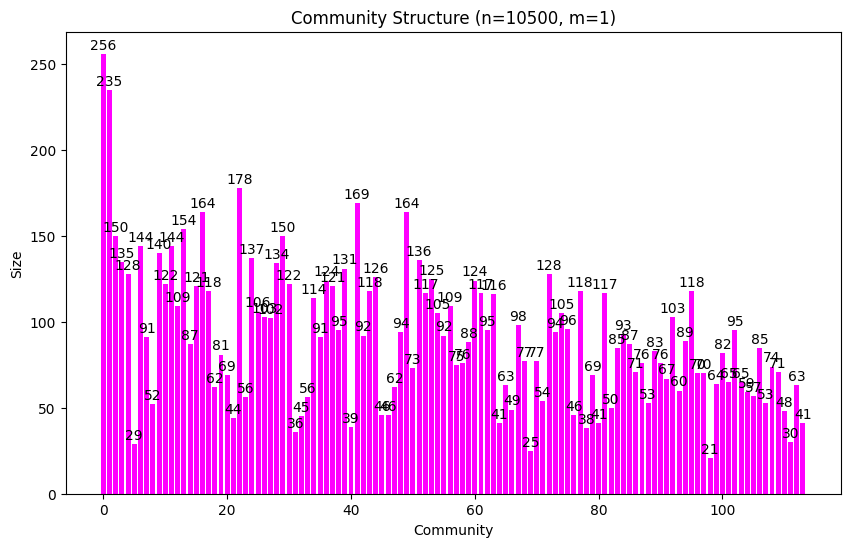

In [ ]:
community_sizes = clusters.sizes()

plt.figure(figsize=(10, 6))
plt.bar(range(len(community_sizes)), community_sizes, color='magenta')

for i, size in enumerate(community_sizes):
  plt.text(i, size + 1, str(size), ha='center', va='bottom')

plt.xlabel('Community')
plt.ylabel('Size')
plt.title('Community Structure (n=10500, m=1)')

plt.show()

In [ ]:
print(f'The modularity is {modularity}')

The modularity is 0.9786711257593639


In [ ]:
assortativity = g.assortativity_degree()

In [ ]:
print(f'The assortativity is {assortativity}')

The assortativity is -0.029133700086676755


**<font color=blue size=4>Question 2(c)**

**Try to generate a larger network with 10500 nodes using the same model. Compute
modularity and assortativity. How is it compared to the smaller network’s modularity?**

We try to generate a larger network with 10500 nodes using the same model. We also plot the graph and community structure, and you can see the results above. The modularity is 0.9786711257593639. The assortativity is -0.029133700086676755. Compare to the smaller network, the modularity is larger than the smaller network's modularity, which indicates that the modularity is related to the number of nodes in the network.


### Question 2(d)

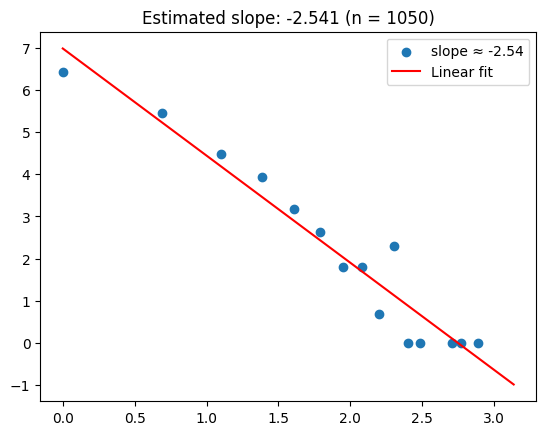

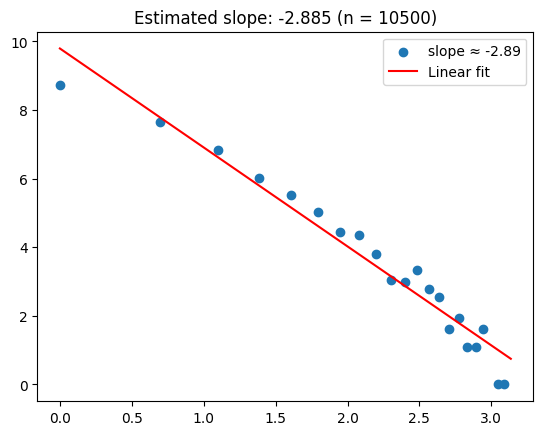

In [ ]:
for n in [1050, 10500]:
  g = ig.Graph.Barabasi(n=n, m=1)
  degrees = g.degree()
  counts, bins = np.histogram(degrees, bins = np.arange(0.5, 24.5, 1))
  X = np.log(np.arange(1, 24, 1))[counts > 0]
  y = np.log(counts[counts > 0])
  X = X.reshape(-1, 1)
  reg = LinearRegression().fit(X, y)
  slope = reg.coef_[0]
  intercept = reg.intercept_
  plt.scatter(X, y, label=f'slope ≈ {slope:.2f}')
  plt.plot(np.log(np.arange(1, 24)), intercept + np.log(np.arange(1,24))*slope, 'r', label='Linear fit')
  plt.title(f'Estimated slope: {round(slope, 3)} (n = {n})')
  plt.legend()
  plt.show()

**<font color=blue size=4>Question 2(d)**

**Plot the degree distribution in a log-log scale for both n = 1050, 10500, then estimate
the slope of the plot using linear regression.**

We plot the degree distribution in a log-log scale for both n = 1050 and 10500. You can see the graphs above. We also estimate the slope of the plot using linear regression. For n = 1050, the slope is -2.54. For n = 10500, the slope is -2.89, which is smaller. It indicates that when n is larger, the slope will be smaller.

### Question 2(e)

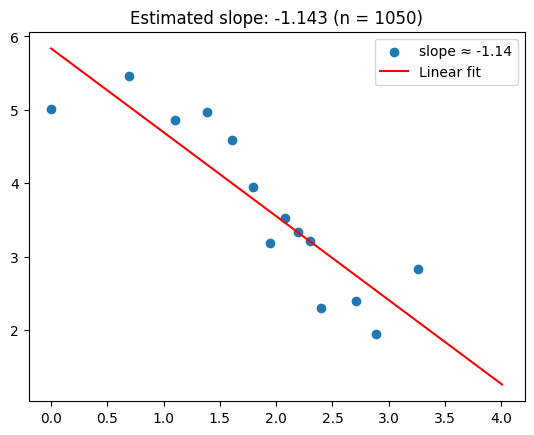

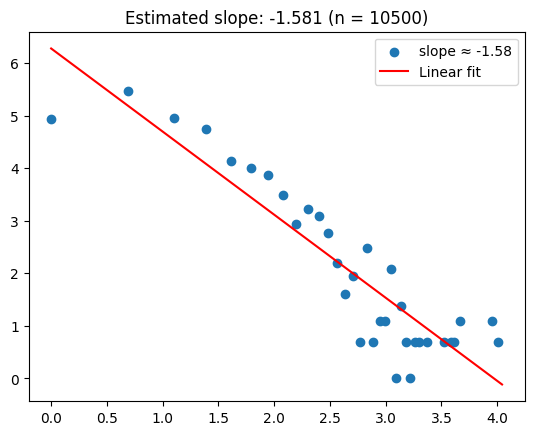

In [ ]:
for n in [1050, 10500]:
  num_simulations = 1000
  degrees = []
  g = ig.Graph.Barabasi(n = n, m=1)
  for _ in range(num_simulations):
    node_i = np.random.randint(0, g.vcount())
    neighbors = g.neighbors(node_i)
    node_j = np.random.choice(neighbors)
    degree_j = g.degree(node_j)
    degrees.append(degree_j)
  counts, bins = np.histogram(degrees, bins = np.arange(0.5, max(degrees) + 0.5, 1))
  X = np.log(np.arange(1, max(degrees), 1))[counts > 0]
  y = np.log(counts[counts > 0])
  X = X.reshape(-1, 1)
  reg = LinearRegression().fit(X, y)
  slope = reg.coef_[0]
  intercept = reg.intercept_
  plt.scatter(X, y, label=f'slope ≈ {slope:.2f}')
  plt.plot(np.log(np.arange(1, max(degrees))), intercept + np.log(np.arange(1,max(degrees)))*slope, 'r', label='Linear fit')
  plt.title(f'Estimated slope: {round(slope, 3)} (n = {n})')
  plt.legend()
  plt.show()

**<font color=blue size=4>Question 2(e)**

**In the two networks generated in 2(a) and 2(c), perform the following:**

**Randomly pick a node i, and then randomly pick a neighbor j of that node. Plot the
degree distribution of nodes j that are picked with this process, in the log-log scale.
Is the distribution linear in the log-log scale? If so, what is the slope? How does this
differ from the node degree distribution?**

We randomly pick a node i, and then randomly pick a neighbor j of that node. And then we plot the degree distribution of nodes j that are picked with this process, in the log-log scale. You can see the results above. The distribution linear is in the log-log scale. For n = 1050, the slope is -1.14. For n = 10500, the slope is -1.58. This is different from the node degree distribution. You can notice that this is more spread out than the node degree distribution and is not concentrated in a straight line. Because this is picking a random point and choosing random neighbors, it leads to more dispersion.

### Question 2(f)

In [ ]:
ds = {age: [] for age in np.arange(1, 1051)}
for _ in range(1000):
  g = ig.Graph.Barabasi(n = n, m=1)
  for node in g.vs:
    ds[node.index + 1].append(node.degree())

Text(0.5, 1.0, 'Expected Degree vs. Age of nodes')

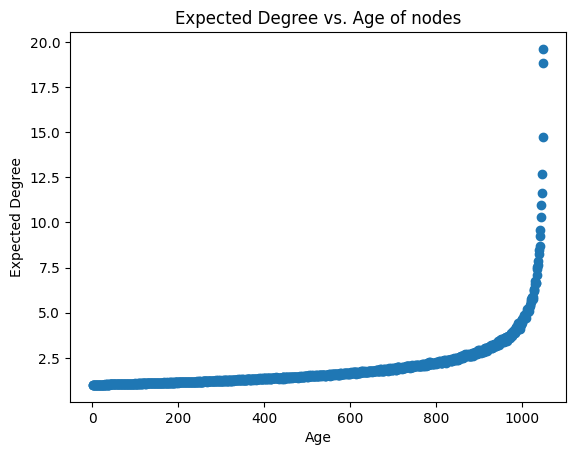

In [ ]:
plt.scatter(np.arange(1, 1051), [np.mean(d) for d in ds.values()][::-1])
plt.xlabel('Age')
plt.ylabel('Expected Degree')
plt.title('Expected Degree vs. Age of nodes')

**<font color=blue size=4>Question 2(f)**

**Estimate the expected degree of a node that is added at time step i for 1 ≤ i ≤ 1050.
Show the relationship between the age of nodes and their expected degree through
an appropriate plot. Note that the newest added node is the youngest.**

We show the relationship between the age of nodes and their expected degree through an appropriate plot. You can see the plot above. For the plot, we can find that when age of node is larger, the expected degree is larger. At age less than 1000, the rate of growth is slower. But when age is over 1000, the rate of growth becomes very fast, almost a vertical line.

### Question 2(g)

In [ ]:
# Repeat 2a with m = 2, 6
for m in [2, 6]:
  if all([ig.Graph.Barabasi(n=1050, m=m).is_connected() for _ in range(10000)]):
    print(f'The preferential attachment model with m = {m} is always connected.')
  else:
    print(f'The preferential attachment model with m = {m} is not always connected.')

The preferential attachment model with m = 2 is always connected.
The preferential attachment model with m = 6 is always connected.


Visualization of the graph (m = 2):


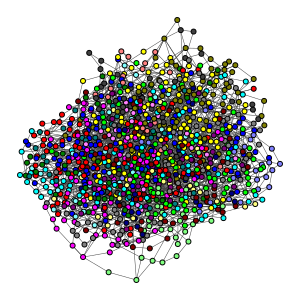

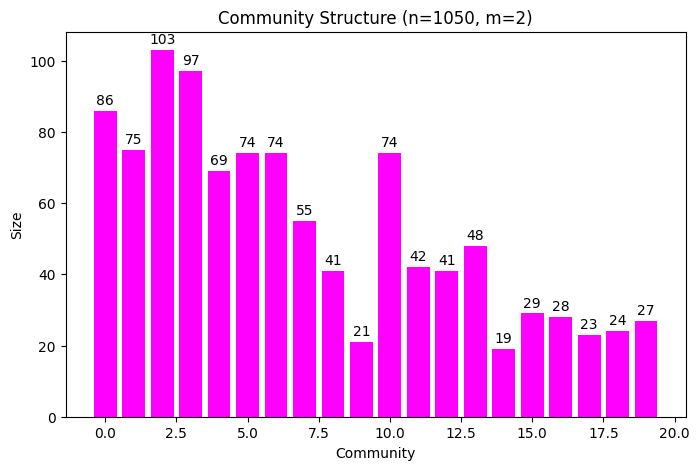

The modularity is 0.5221770365230981
The assortativity is -0.04313899139482385
Visualization of the graph (m = 6):


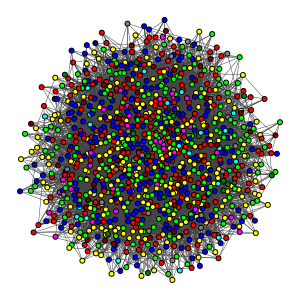

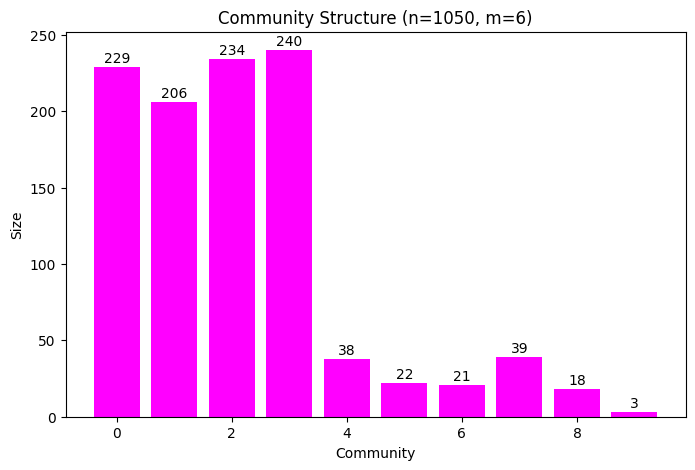

The modularity is 0.25328100166588713
The assortativity is -0.0075470982540233695


In [ ]:
# Repeat 2b with m = 2, 6
for m in [2, 6]:
  g = ig.Graph.Barabasi(n=1050, m=m)
  communities = g.community_fastgreedy()
  clusters = communities.as_clustering()
  modularity = clusters.modularity
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  g.vs['color'] = colors.get_many(clusters.membership)

  visual_style = {
  "bbox": (300, 300),
  "margin": 20,
  "vertex_size": 5,
  "edge_width": 0.5,
  "vertex_color": g.vs['color']
  }
  plot_path = f"/content/graph_plot_{m}.png"
  ig.plot(g, plot_path, **visual_style)
  print(f'Visualization of the graph (m = {m}):')
  display(Image(filename=plot_path))
  os.remove(plot_path)

  plt.figure(figsize=(8, 5))
  plt.bar(range(len(community_sizes)), community_sizes, color='magenta')

  for i, size in enumerate(community_sizes):
    plt.text(i, size + 1, str(size), ha='center', va='bottom')

  plt.xlabel('Community')
  plt.ylabel('Size')
  plt.title(f'Community Structure (n=1050, m={m})')

  plt.show()

  print(f'The modularity is {modularity}')
  assortativity = g.assortativity_degree()
  print(f'The assortativity is {assortativity}')

Visualization of the graph (m = 2):


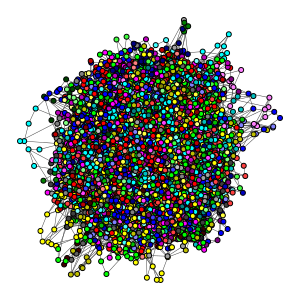

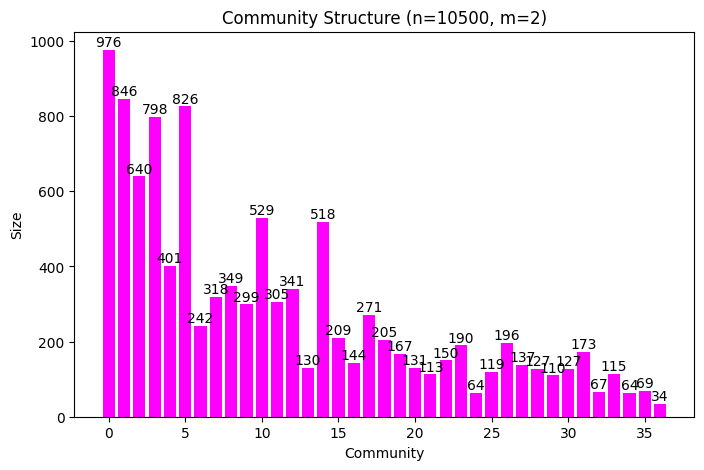

The modularity is 0.5308751711875127
The assortativity is -0.010623307125522606
Visualization of the graph (m = 6):


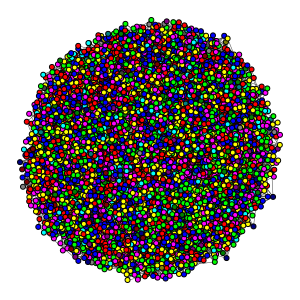

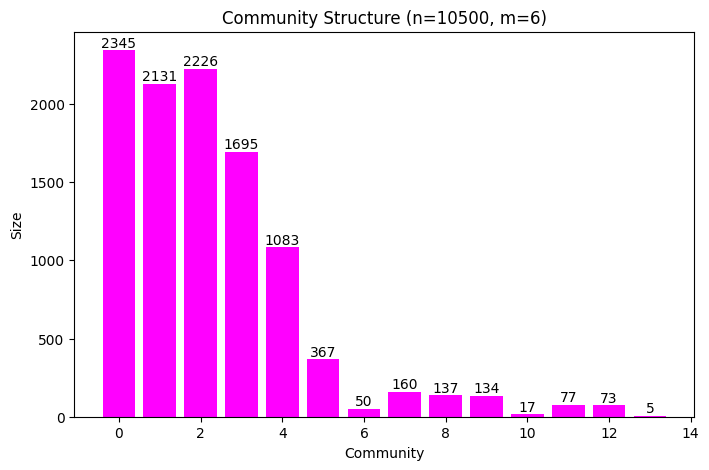

The modularity is 0.24913248694709889
The assortativity is -0.0052104272237945325


In [ ]:
# Repeat 2b with m = 2, 6
for m in [2, 6]:
  g = ig.Graph.Barabasi(n=10500, m=m)
  communities = g.community_fastgreedy()
  clusters = communities.as_clustering()
  modularity = clusters.modularity
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  g.vs['color'] = colors.get_many(clusters.membership)

  visual_style = {
  "bbox": (300, 300),
  "margin": 20,
  "vertex_size": 5,
  "edge_width": 0.5,
  "vertex_color": g.vs['color']
  }
  plot_path = f"/content/graph_plot_{m}.png"
  ig.plot(g, plot_path, **visual_style)
  print(f'Visualization of the graph (m = {m}):')
  display(Image(filename=plot_path))
  os.remove(plot_path)

  plt.figure(figsize=(8, 5))
  plt.bar(range(len(community_sizes)), community_sizes, color='magenta')

  for i, size in enumerate(community_sizes):
    plt.text(i, size + 1, str(size), ha='center', va='bottom')

  plt.xlabel('Community')
  plt.ylabel('Size')
  plt.title(f'Community Structure (n=10500, m={m})')

  plt.show()

  print(f'The modularity is {modularity}')
  assortativity = g.assortativity_degree()
  print(f'The assortativity is {assortativity}')

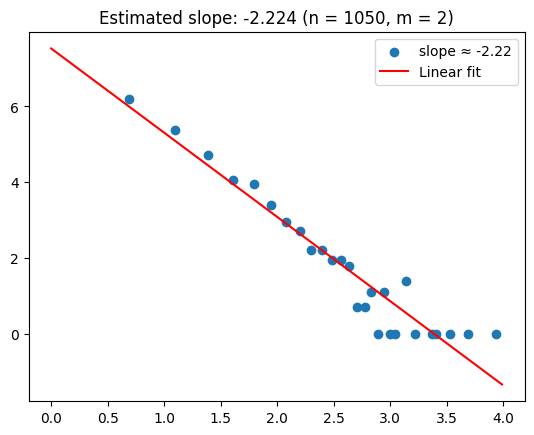

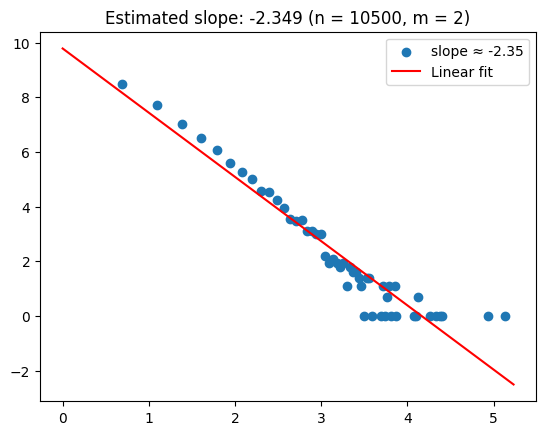

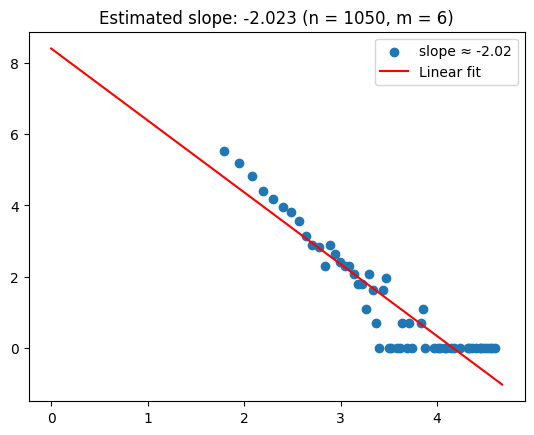

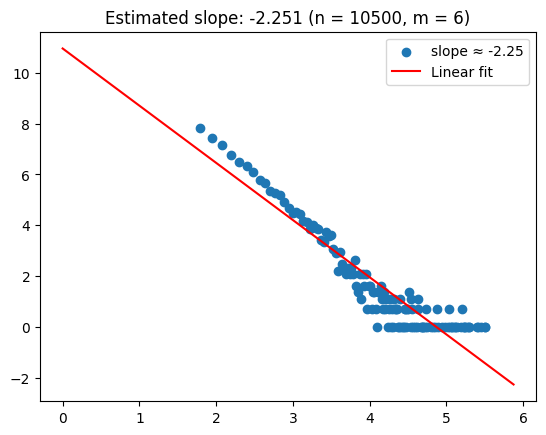

In [ ]:
# Repeat 2d with m = 2, 6
for m in [2, 6]:
  for n in [1050, 10500]:
    g = ig.Graph.Barabasi(n=n, m=m)
    degrees = g.degree()
    counts, bins = np.histogram(degrees, bins = np.arange(0.5, max(degrees) + 0.5, 1))
    X = np.log(np.arange(1, max(degrees), 1))[counts > 0]
    y = np.log(counts[counts > 0])
    X = X.reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    slope = reg.coef_[0]
    intercept = reg.intercept_
    plt.scatter(X, y, label=f'slope ≈ {slope:.2f}')
    plt.plot(np.log(np.arange(1, max(degrees))), intercept + np.log(np.arange(1,max(degrees)))*slope, 'r', label='Linear fit')
    plt.title(f'Estimated slope: {round(slope, 3)} (n = {n}, m = {m})')
    plt.legend()
    plt.show()

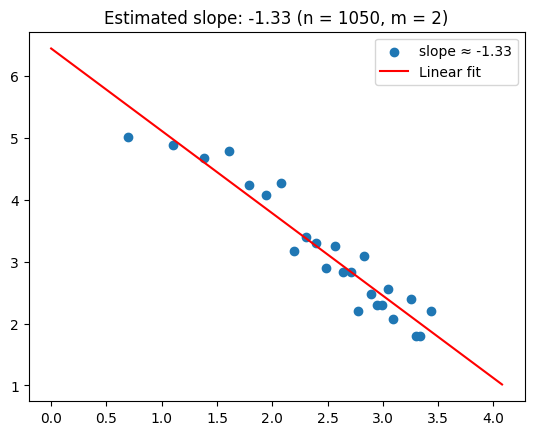

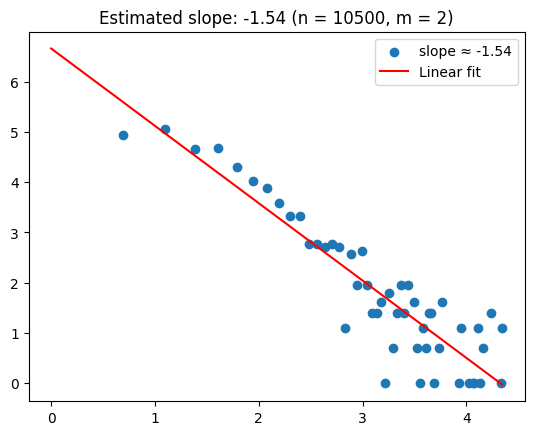

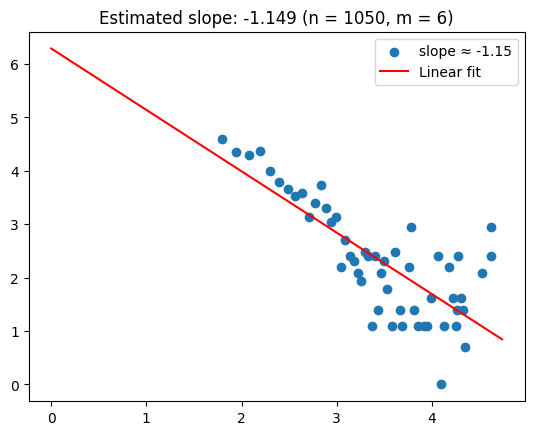

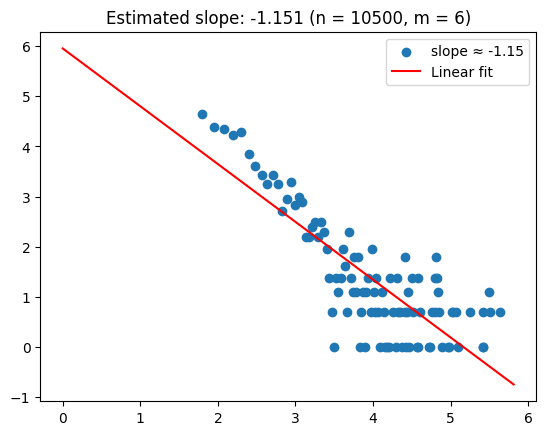

In [ ]:
# Repeat 2e with m = 2, 6
for m in [2, 6]:
  for n in [1050, 10500]:
    num_simulations = 1000
    degrees = []
    g = ig.Graph.Barabasi(n = n, m=m)
    for _ in range(num_simulations):
      node_i = np.random.randint(0, g.vcount())
      neighbors = g.neighbors(node_i)
      node_j = np.random.choice(neighbors)
      degree_j = g.degree(node_j)
      degrees.append(degree_j)
    counts, bins = np.histogram(degrees, bins = np.arange(0.5, max(degrees) + 0.5, 1))
    X = np.log(np.arange(1, max(degrees), 1))[counts > 0]
    y = np.log(counts[counts > 0])
    X = X.reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    slope = reg.coef_[0]
    intercept = reg.intercept_
    plt.scatter(X, y, label=f'slope ≈ {slope:.2f}')
    plt.plot(np.log(np.arange(1, max(degrees))), intercept + np.log(np.arange(1,max(degrees)))*slope, 'r', label='Linear fit')
    plt.title(f'Estimated slope: {round(slope, 3)} (n = {n}, m = {m})')
    plt.legend()
    plt.show()

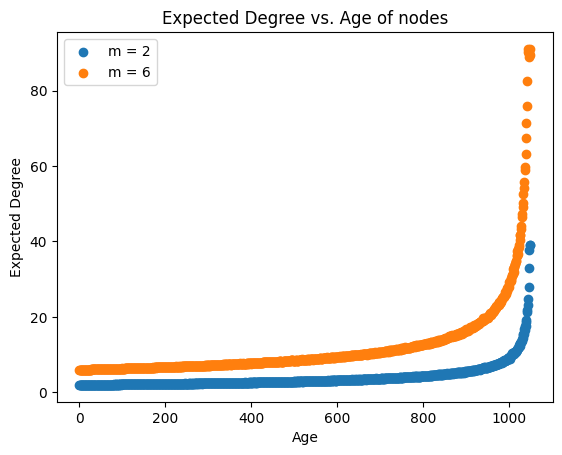

In [ ]:
# Repeat 2f with m = 2, 6
for m in [2, 6]:
  ds = {age: [] for age in np.arange(1, 1051)}
  for _ in range(1000):
    g = ig.Graph.Barabasi(n = 1050, m=m)
    for node in g.vs:
      ds[node.index + 1].append(node.degree())
  plt.scatter(np.arange(1, 1051), [np.mean(d) for d in ds.values()][::-1], label = f'm = {m}')
  plt.xlabel('Age')
  plt.ylabel('Expected Degree')
  plt.title(f'Expected Degree vs. Age of nodes')
plt.legend()

**<font color=blue size=4>Question 2(g)**

**Repeat the previous parts (a-f) for m = 2, and m = 6. Compare the results of each
part for different values of m.**

**For part (a):**

When m = 1, the network is always connected. When m = 2, the network is always connected. When m = 6, the network is always connected.  For different values of m, the results are all the same.

**For part (b):**

For n = 1050, when m = 1, the modularity is 0.9349609824055048. The assortativity is -0.07867840696526218. When m = 2, the modularity is 0.5221770365230981. The assortativity is -0.04313899139482385. When m = 6, the modularity is 0.25328100166588713. The assortativity is -0.0075470982540233695. You can find that when m is smaller, the modularity is larger. The assortativity is also larger.

**For part (c):**

For n = 10500, when m = 1, the modularity is 0.9786711257593639. The assortativity is -0.029133700086676755. When m = 2, the modularity is 0.5308751711875127. The assortativity is -0.010623307125522606. When m = 6, the modularity is 0.24913248694709889. The assortativity is -0.0052104272237945325. You can find that when m is smaller, the modularity is larger. The assortativity is also larger.

**For part (d):**

When m = 1, for n = 1050, the slope is -2.54. For n = 10500, the slope is -2.89. When m = 2, for n = 1050, the slope is -2.22. For n = 10500, the slope is -2.35. When m = 6, for n = 1050, the slope is -2.02. For n = 10500, the slope is -2.25. You can see that for when m is larger, the slope for these two networks is larger.

**For part (e):**

When m = 1, for n = 1050, the slope is -1.14. For n = 10500, the slope is -1.58. When m = 2, for n = 1050, the slope is -1.33. For n = 10500, the slope is -1.54. When m = 6, for n = 1050, the slope is -1.15. For n = 10500, the slope is -1.15. You can see that for when m is larger, the slope for these two networks is larger.

**For part (f):**

When m = 1, 2, and 6, we find that when age of node is larger, the expected degree is larger. And when age less than 1000, the rate of growth is slower. But when age is over 1000, the rate of growth becomes very fast, almost a vertical line. They have the similar trend.


### Question 2(h)

Modularity of Preferential Attachment Network: 0.929566585272096


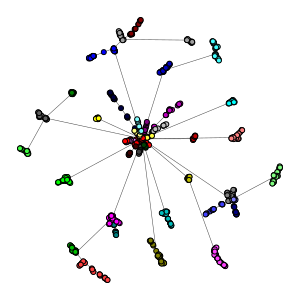

In [ ]:
g = ig.Graph.Barabasi(n=1050, m=1)

communities = g.community_fastgreedy()
clusters = communities.as_clustering()
modularity = clusters.modularity
colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
g.vs['color'] = colors.get_many(clusters.membership)

visual_style = {
  "bbox": (300, 300),
  "margin": 20,
  "vertex_size": 5,
  "edge_width": 0.5,
  "vertex_color": g.vs['color']
}

print(f'Modularity of Preferential Attachment Network: {modularity}')
ig.plot(g, **visual_style)

In [ ]:
degrees = g.degree()
stubs = np.repeat(np.arange(g.vcount()), degrees).tolist()

edges = set()
while len(stubs) > 0:
  node_1, node_2 = np.random.choice(stubs, 2, replace = False)
  if node_1 != node_2 and (node_1, node_2) not in edges and (node_2, node_1) not in edges:
    edges.add((node_1, node_2))
    stubs.remove(node_1)
    stubs.remove(node_2)
  else:
    continue

Modularity of Stub-Matching Network: 0.8453068472311439


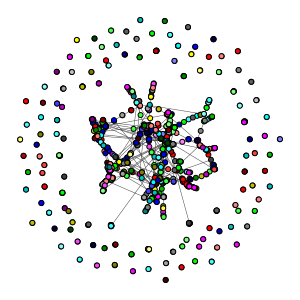

In [ ]:
new_g = ig.Graph(edges=edges)

communities = new_g.community_fastgreedy()
clusters = communities.as_clustering()
modularity = clusters.modularity
colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
g.vs['color'] = colors.get_many(clusters.membership)

print(f'Modularity of Stub-Matching Network: {modularity}')
ig.plot(new_g, **visual_style)

**<font color=blue size=4>Question 2(h)**

**Again, generate a preferential attachment network with n = 1050, m = 1. Take its
degree sequence and create a new network with the same degree sequence, through
stub-matching procedure. Plot both networks, mark communities on their plots,
and measure their modularity. Compare the two procedures for creating random
power-law networks.**

We generate a preferential attachment network with n = 1050, m = 1, and we plot both networks, mark communities on their plots, and measure their modularity. You can see the results above. The modularity of Preferential Attachment Network: 0.929566585272096. The modularity of Stub-Matching Network: 0.8453068472311439. You can find that the modularity for preferential attachment network is larger. Preferential attachment and stub-matching algorithms produce random power-law networks with similar degree distributions. However, the preferential attachment approach results in networks with greater clustering coefficients and shorter average path lengths than the stub-matching procedure. This is because preferential attachment produces networks with more local connections, whereas stub-matching produces networks with more global connections.


## 3. Create a modified preferential attachment model that penalizes the age of a node

### Question 3(a)

In [ ]:
def calculate_probability(ki, li):
  return (ki + 1) * (li ** -1)

In [ ]:
g = ig.Graph(n=1)
for i in range(1, 1050):
  ages = [i - node.index  for node in g.vs]
  probabilities = [calculate_probability(ki, li) for ki, li in zip(g.degree(), ages)]
  probabilities = [p / sum(probabilities) for p in probabilities]
  neighbor = np.random.choice(g.vcount(), 1, replace=False, p=probabilities)
  g.add_vertex(age=i)
  g.add_edges([(i, neighbor[0])])

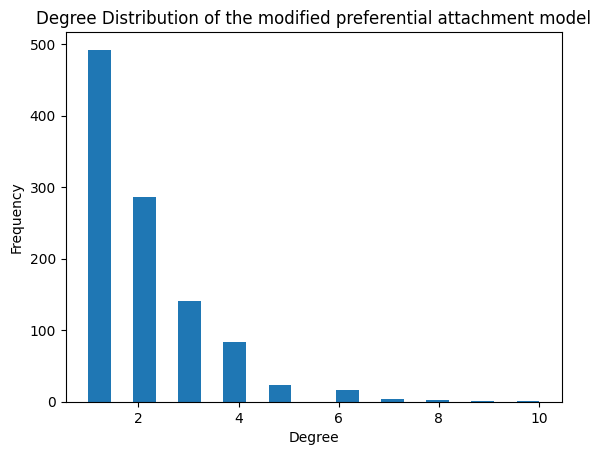

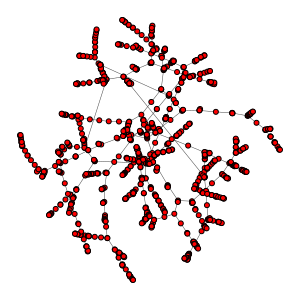

In [ ]:
degrees = g.degree()
plt.hist(degrees, bins=20, log=False)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title(f'Degree Distribution of the modified preferential attachment model')
plt.show()
visual_style = {
  "bbox": (300, 300),
  "margin": 20,
  "vertex_size": 5,
  "edge_width": 0.5}
ig.plot(g, **visual_style)

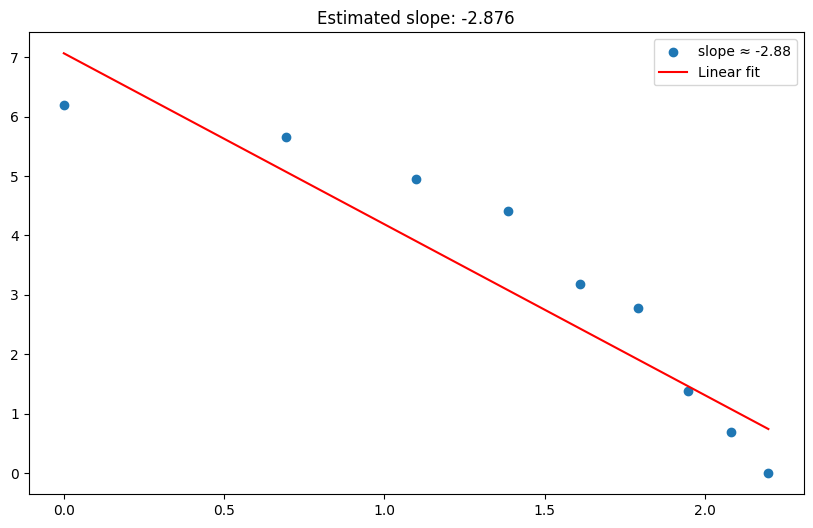

Power Law Exponent: 2.876


In [ ]:
counts, bins = np.histogram(degrees, bins=np.arange(0.5, max(degrees) + 0.5, 1))
X = np.log(np.arange(1, max(degrees), 1))[counts > 0]
y = np.log(counts[counts > 0])
X = X.reshape(-1, 1)
reg = LinearRegression().fit(X, y)
slope = reg.coef_[0]
plt.figure(figsize=(10, 6))
plt.scatter(X, y, label=f'slope ≈ {slope:.2f}')
plt.plot(np.log(np.arange(1, max(degrees))), intercept + np.log(np.arange(1,max(degrees)))*slope, 'r', label='Linear fit')
plt.title(f'Estimated slope: {round(slope, 3)}')
plt.legend()
plt.show()
print(f'Power Law Exponent: {-round(slope, 3)}')

**<font color=blue size=4>Question 3(a)**

**Each time a new vertex is added, it creates m links to old vertices and the probability that an old vertex is cited depends on its degr (preferential attachment) and age. In particular, the probability that a newly added vertex connects to an old vertex is proportional to:**

**P[i] ∼ (ckαi + a)(dlβi + b),**

**where ki is the degree of vertex i in the current time step, and li is the age of vertex i. Produce such an undirected network with 1050 nodes and parameters m = 1,α = 1, β = −1, and a = c = d = 1, b = 0. Plot the degree distribution. What is the power law exponent?**

We produce such an undirected network with 1050 nodes and parameters m = 1, α = 1, β = −1, and a = c = d = 1, b = 0. We also plot the degree distribution. You can see the results above. When degree is 1, the frequency is largest, which is over 400. When degree is 2, the frequency is almost 300. When degree is increase, the frequency is decrease. We also plot the degree distribution in log scale. You can see the plot above. We estimate that the slope is -2.876. And the power law exponent is 2.876.

### Question 3(b)

Modularity of modified preferential attachment model: 0.9372610530161275


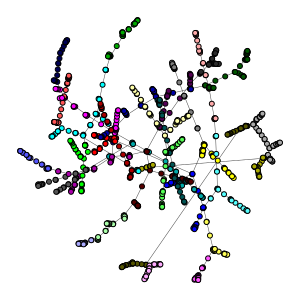

In [ ]:
communities = g.community_fastgreedy()
clusters = communities.as_clustering()
modularity = clusters.modularity
colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
g.vs['color'] = colors.get_many(clusters.membership)

print(f'Modularity of modified preferential attachment model: {modularity}')
ig.plot(g, **visual_style)

**<font color=blue size=4>Question 3(b)**

**Use fast greedy method to find the community structure. What is the modularity?**

We use fast greedy method to find the community structure. You can see the graph above. The modularity of modified preferential attachment model is 0.9372610530161275.

# Part 2: Random Walk on Networks

## 1. Random walk on Erd¨os-R´enyi networks

### Question 1(a)

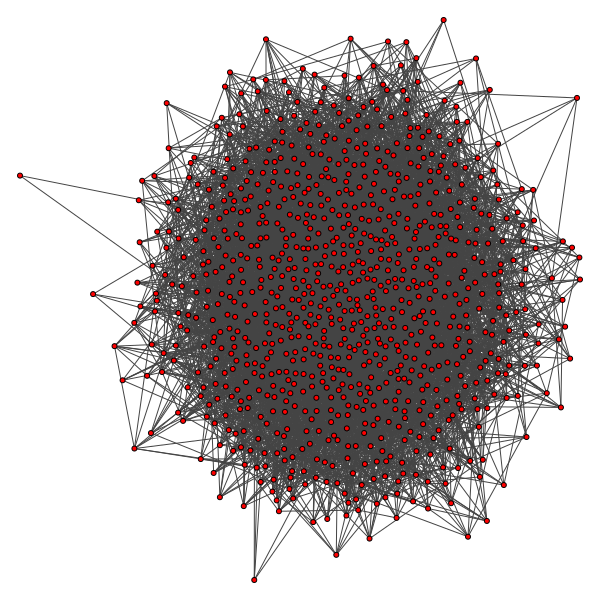

In [ ]:
n = 900
p = 0.015
g = ig.Graph.Erdos_Renyi(n=n, p=p)
ig.plot(g, bbox=(0, 0, 600, 600), vertex_size=5)

**<font color=blue size=4>Question 1(a)**

**Create an undirected random network with 900 nodes, and the probability p for
drawing an edge between any pair of nodes equal to 0.015.**

We create an undirected random network with 900 nodes, and the probability p for drawing an edge between any pair of nodes equal to 0.015. You can see the network above.

### Question 1(b)

In [ ]:
n = 900
p = 0.015
num_walks = 1000
max_steps = 100

g = ig.Graph.Erdos_Renyi(n=n, p=p)

def random_walk(graph, max_steps):
    start_node = np.random.choice(graph.vcount())
    current_node = start_node
    distances = []

    for _ in range(max_steps):
        neighbors = graph.neighbors(current_node)
        if neighbors:
            current_node = np.random.choice(neighbors)
        distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])

    return distances

all_distances = [random_walk(g, max_steps) for _ in range(num_walks)]

avg_distances = np.mean(all_distances, axis=0)
variances = np.var(all_distances, axis=0)

steps = list(range(max_steps))

<ipython-input-3-118de5fdae58>:17: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])


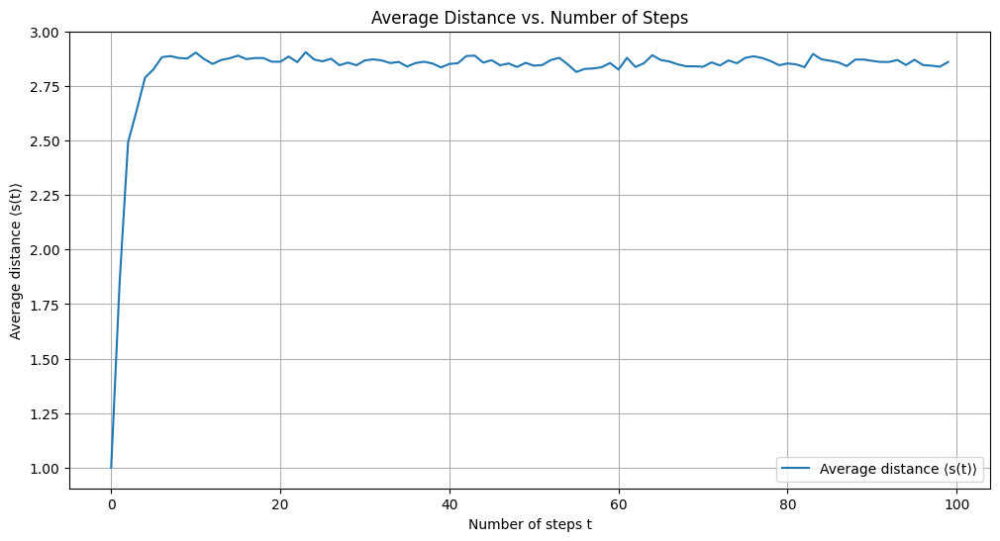

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(steps, avg_distances, label='Average distance ⟨s(t)⟩')
plt.xlabel('Number of steps t')
plt.ylabel('Average distance ⟨s(t)⟩')
plt.title('Average Distance vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

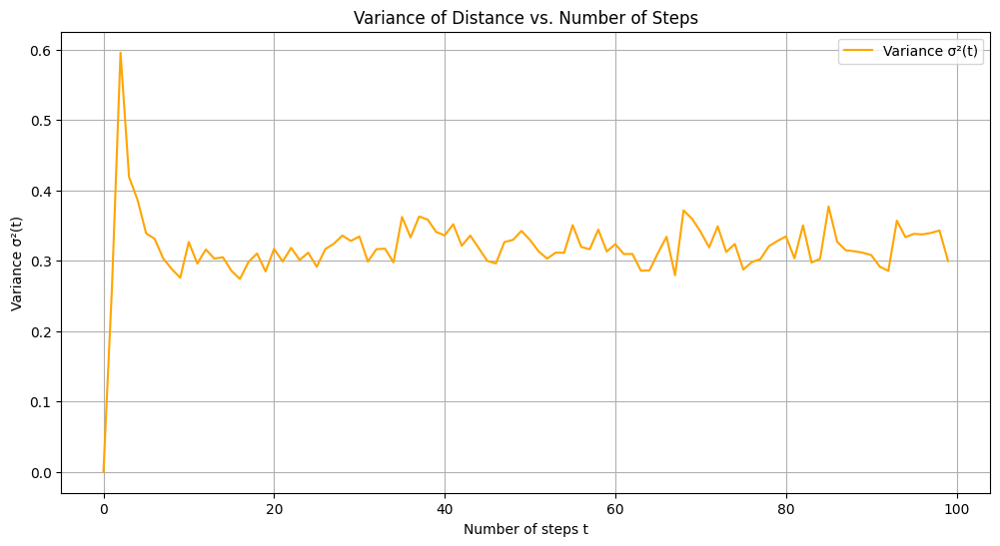

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(steps, variances, label='Variance σ²(t)', color='orange')
plt.xlabel('Number of steps t')
plt.ylabel('Variance σ²(t)')
plt.title('Variance of Distance vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

**<font color=blue size=4>Question 1(b)**

**Let a random walker start from a randomly selected node (no teleportation). We use t to denote the number of steps that the walker has taken. Measure the average distance (defined as the shortest path length) ⟨s(t)⟩ of the walker from his starting point at step t. Also, measure the variance σ^2(t) = ⟨(s(t) − ⟨s(t)⟩)^2⟩ of this distance.Plot ⟨s(t)⟩ v.s. t and σ^2(t) v.s. t. Here, the average ⟨·⟩ is over random choices of the starting nodes.**

We measure the average distance (defined as the shortest path length) ⟨s(t)⟩ of the walker from his starting point at step t. We also measure the variance σ 2 (t) = ⟨(s(t) − ⟨s(t)⟩) 2 ⟩ of this distance. And we plot ⟨s(t)⟩ v.s. t and σ^2 (t) v.s. t. You can see the graphs above. For here, we choose num_walks = 1000 and max_steps = 100. When num_walks is large, it will get the better results, but the running time will also increase. From the Average Distance vs. Number of Steps graph, we can find that after t = 10, all average distance are over 2.75. From the Variance of Distance vs. Number of Steps graph, we can find that the variance will get 0.3 to 0.4 after t = 10. The results are what we expected.

### Question 1(c)

In [ ]:
def random_walk_last_degree(graph, max_steps):
    start_node = np.random.choice(graph.vcount())
    current_node = start_node
    for _ in range(max_steps):
        neighbors = graph.neighbors(current_node)
        if neighbors:
            current_node = np.random.choice(neighbors)

    return graph.degree(current_node)

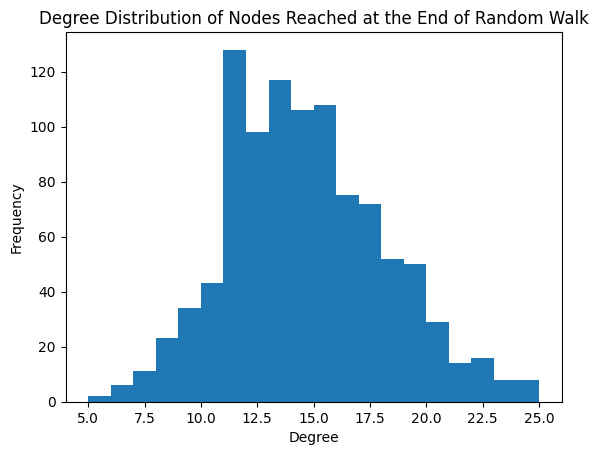

In [ ]:
last_degrees = [random_walk_last_degree(g, 100) for _ in range(1000)]
plt.hist(last_degrees, bins=20, log=False)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of Nodes Reached at the End of Random Walk')
plt.show()

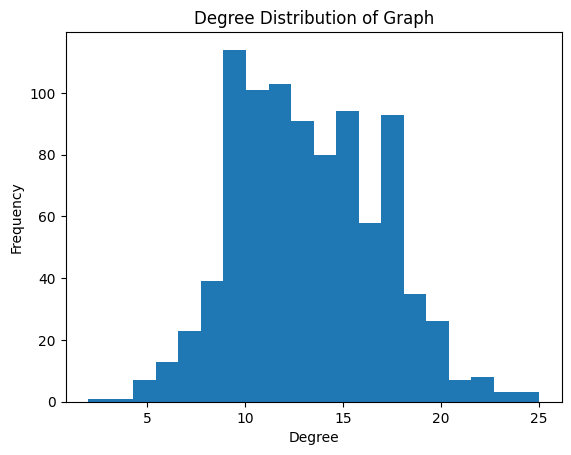

In [ ]:
degrees = g.degree()
plt.hist(degrees, bins=20, log=False)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of Graph')
plt.show()

**<font color=blue size=4>Question 1(c)**

**Measure the degree distribution of the nodes reached at the end of the random walk.
How does it compare to the degree distribution of graph?**

We measure the degree distribution of the nodes reached at the end of the random walk. You can see the plot above. We also plot the degree distribution of graph in order to compare. You can see it above. For these two plots, we find that these two plots are highly related. For the first plot, frequency is highest when the degree is between 10 and 20. This is almost the same for the second graph. So we can conclude that these two graphs are highly related.

### Question 1(d)

In [ ]:
n = 9000
p = 0.015
num_walks = 1000
max_steps = 100

g = ig.Graph.Erdos_Renyi(n=n, p=p)

def random_walk(graph, max_steps):
    start_node = np.random.choice(graph.vcount())
    current_node = start_node
    distances = []

    for _ in range(max_steps):
        neighbors = graph.neighbors(current_node)
        if neighbors:
            current_node = np.random.choice(neighbors)
        distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])

    return distances

all_distances = [random_walk(g, max_steps) for _ in range(num_walks)]

avg_distances = np.mean(all_distances, axis=0)
variances = np.var(all_distances, axis=0)

steps = list(range(max_steps))

<ipython-input-3-adcd7aa0d8fd>:17: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])


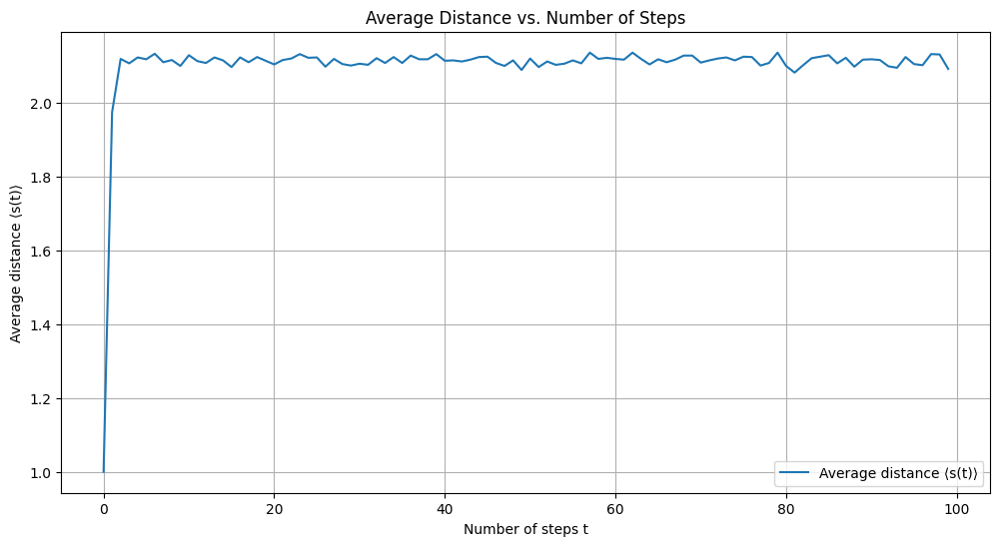

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(steps, avg_distances, label='Average distance ⟨s(t)⟩')
plt.xlabel('Number of steps t')
plt.ylabel('Average distance ⟨s(t)⟩')
plt.title('Average Distance vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

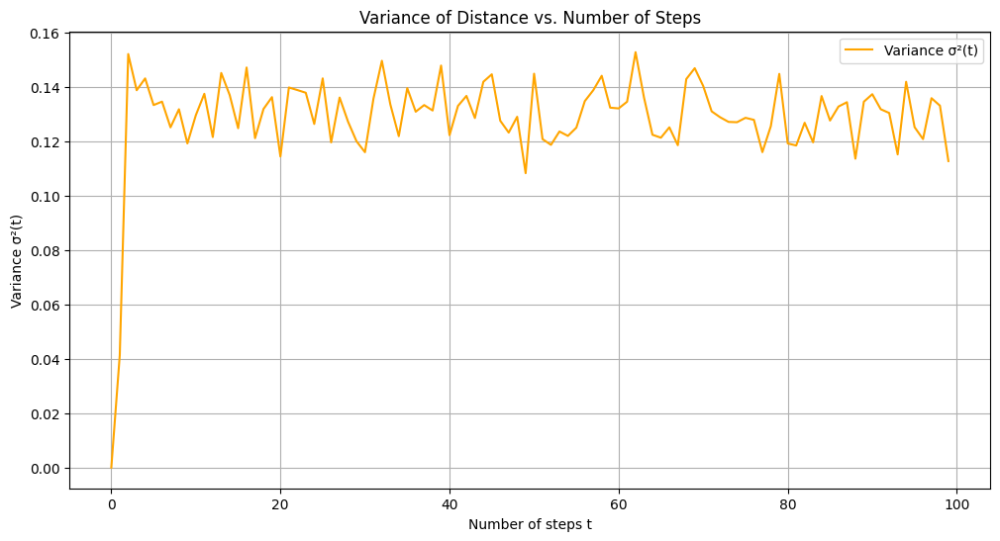

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(steps, variances, label='Variance σ²(t)', color='orange')
plt.xlabel('Number of steps t')
plt.ylabel('Variance σ²(t)')
plt.title('Variance of Distance vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

**<font color=blue size=4>Question 1(d)**

**Repeat 1(b) for undirected random networks with 9000 nodes. Compare the results
and explain qualitatively. Does the diameter of the network play a role?**

We repeat 1(b) for undirected random networks with 9000 nodes. And you can find the results above. For here, we still choose num_walks = 1000 and max_steps = 100. When num_walks is large, it will get the better results, but the running time will also increase. From the Average Distance vs. Number of Steps graph, we can find that after t = 5, all average distance are over 2.00. From the Variance of Distance vs. Number of Steps graph, we can find that the variance will get 0.12 to 0.14 after t = 5. Throught compare the results, we can find that with a smaller graph, it will take more steps to make average distance and variance of distance stable. For the samller graph, it takes 10 steps to be stable. For larger graph, it only takes 5 steps to be stable. Also, for smaller graph, it will have larger average distance and variance of distance. Also, the diameter of the network play a role. The samller graph has the samller diameter. The larger graph has the large diameter, and it will contain more information. In this case, it will take fewer steps to make it stable.

## 2. Random walk on networks with fat-tailed degree distribution

### Question 2(a)

In [ ]:
n = 900
m = 1
num_walks = 200
max_steps = 200

g = ig.Graph.Barabasi(n=n, m=m)

def random_walk(graph, max_steps):
    start_node = np.random.choice(graph.vcount())
    current_node = start_node
    distances = []

    for _ in range(max_steps):
        neighbors = graph.neighbors(current_node)
        if neighbors:
            current_node = np.random.choice(neighbors)
        distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])

    return distances

all_distances = [random_walk(g, max_steps) for _ in range(num_walks)]

avg_distances = np.mean(all_distances, axis=0)
variances = np.var(all_distances, axis=0)

<ipython-input-4-52151206adae>:17: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])


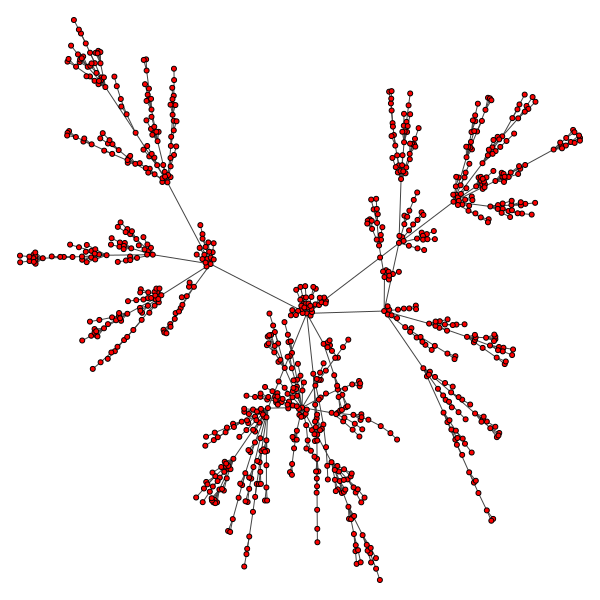

In [ ]:
# plot the network
ig.plot(g, bbox=(0, 0, 600, 600), vertex_size=5)

**<font color=blue size=4>Question 2(a)**

**Generate an undirected preferential attachment network with 900 nodes, where each
new node attaches to m = 1 old nodes.**

We created a preferential attachment network with 900 nodes and m=1. You can see the network above.

### Question 2(b)

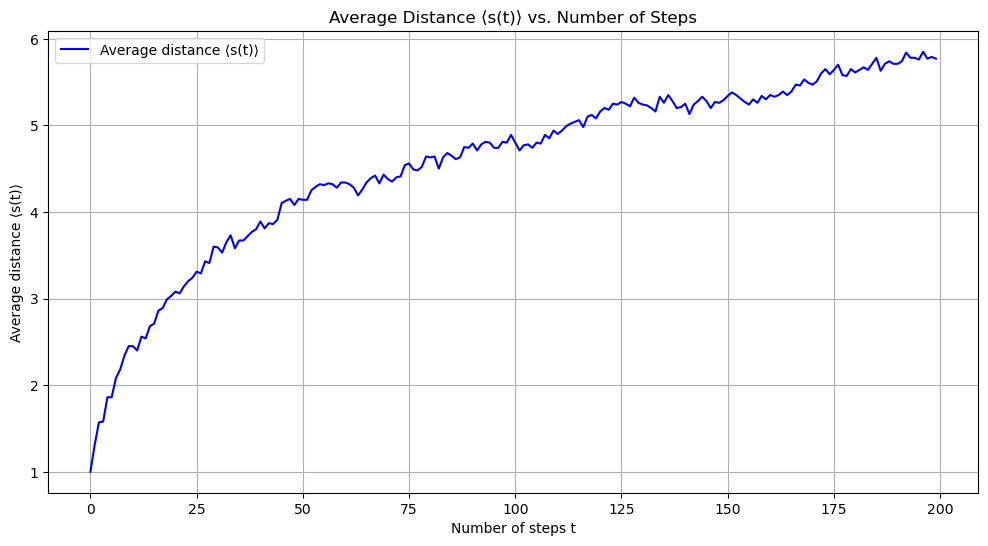

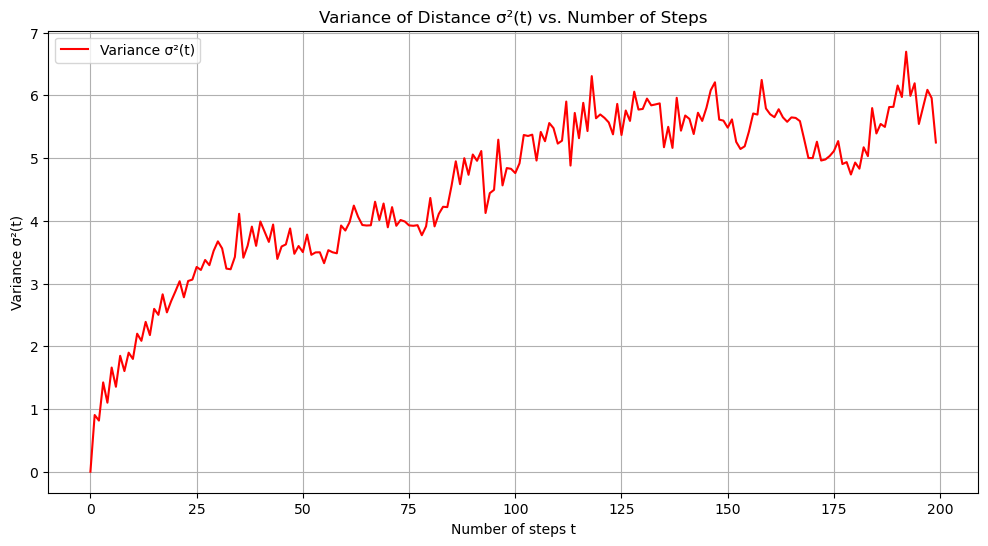

In [ ]:
# Plotting average distances ⟨s(t)⟩ vs t
plt.figure(figsize=(12, 6))
plt.plot(range(max_steps), avg_distances, label='Average distance ⟨s(t)⟩', color='blue')
plt.xlabel('Number of steps t')
plt.ylabel('Average distance ⟨s(t)⟩')
plt.title('Average Distance ⟨s(t)⟩ vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

# Plotting variance σ²(t) vs t
plt.figure(figsize=(12, 6))
plt.plot(range(max_steps), variances, label='Variance σ²(t)', color='red')
plt.xlabel('Number of steps t')
plt.ylabel('Variance σ²(t)')
plt.title('Variance of Distance σ²(t) vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

**<font color=blue size=4>Question 2(b)**

**Let a random walker start from a randomly selected node. Measure and plot ⟨s(t)⟩ v.s. t and σ^2(t) v.s. t.**

We measured and plotted the average and variance of the number of visited nodes as a function of time. You can see the results above. As the degree increases, the average number of visited nodes increases, and the variance of the number of visited nodes also increases.


### Question 2(c)

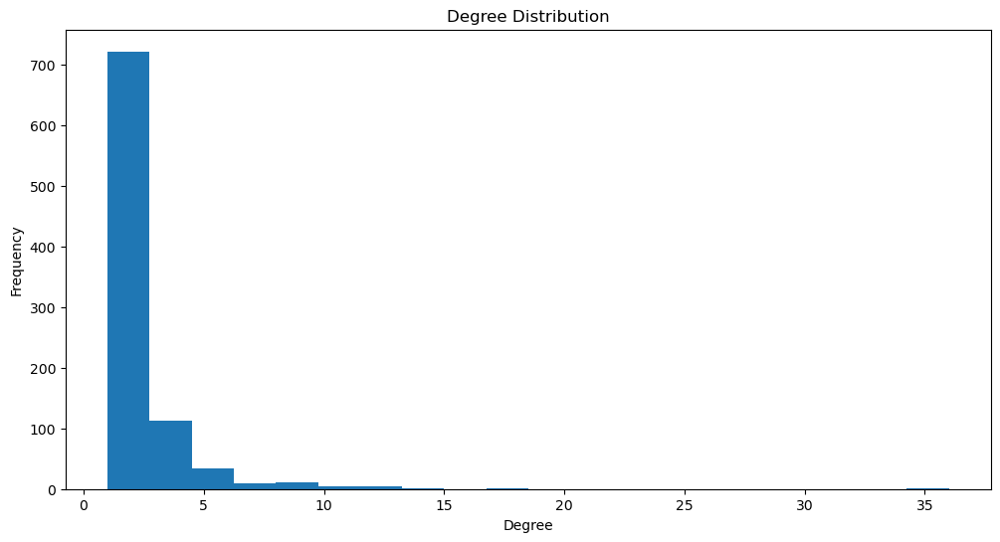

In [ ]:
# plot the degree distribution
degree_distribution = g.degree()

plt.figure(figsize=(12, 6))
plt.hist(degree_distribution, bins=20)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution')
plt.show()

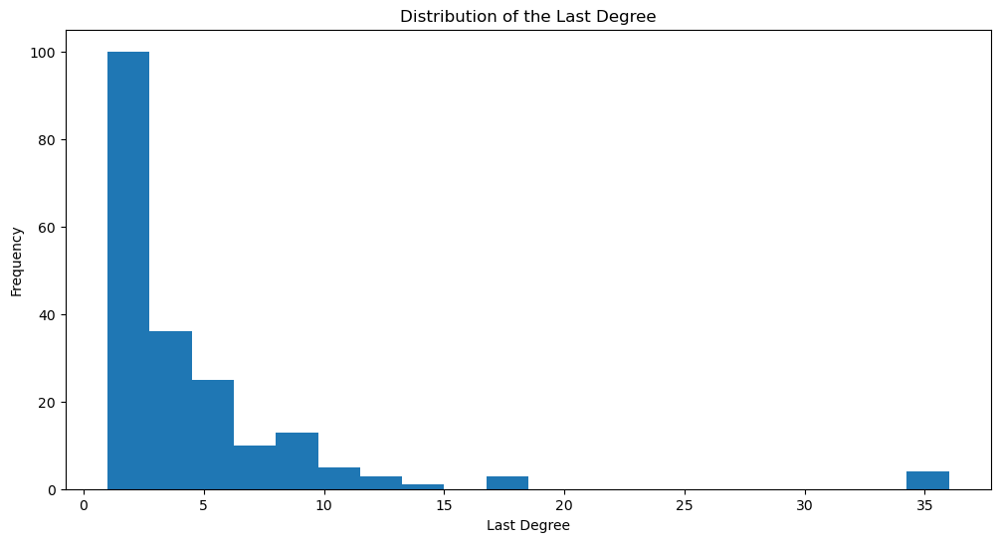

In [ ]:
def random_walk_last_degree(graph, max_steps):
    start_node = np.random.choice(graph.vcount())
    current_node = start_node
    for _ in range(max_steps):
        neighbors = graph.neighbors(current_node)
        if neighbors:
            current_node = np.random.choice(neighbors)

    return graph.degree(current_node)


all_last_degrees = [random_walk_last_degree(g, max_steps) for _ in range(num_walks)]

# Plotting the distribution of the last degree
plt.figure(figsize=(12, 6))
plt.hist(all_last_degrees, bins=20)
plt.xlabel('Last Degree')
plt.ylabel('Frequency')
plt.title('Distribution of the Last Degree')
plt.show()

**<font color=blue size=4>Question 2(c)**

**Measure the degree distribution of the nodes reached at the end of the random walk
on this network. How does it compare with the degree distribution of the graph?**

We measured the degree distribution of the nodes reached at the end of the random walk. You can see the results above. The degree distribution of the nodes reached at the end of the random walk is similar to the degree distribution of the graph. We also observe the quick decay of the degree distribution of the nodes reached at the end of the random walk.


### Question 2(d)

/var/folders/f0/f6mb0ksn3flbsvtdd93lppk40000gp/T/ipykernel_37213/2258473043.py:18: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])


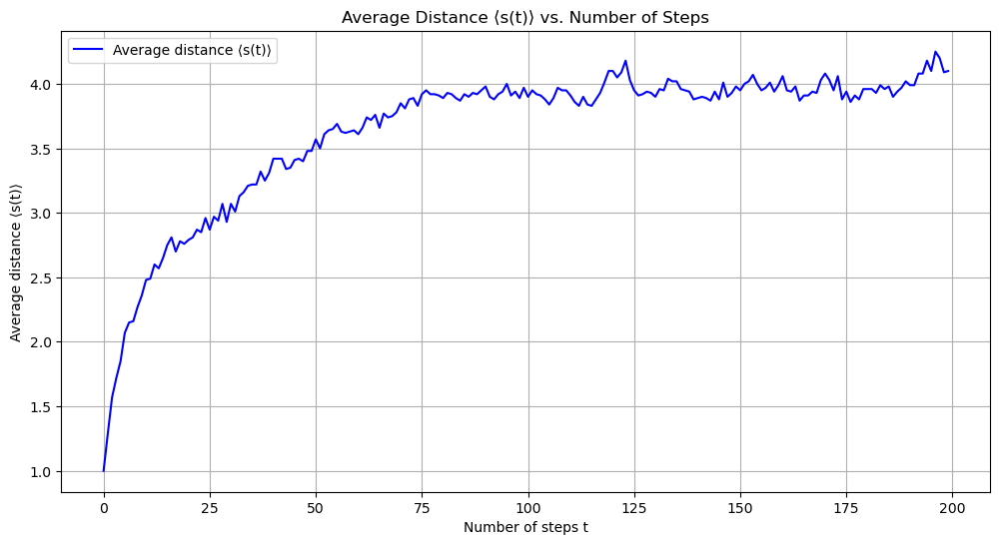

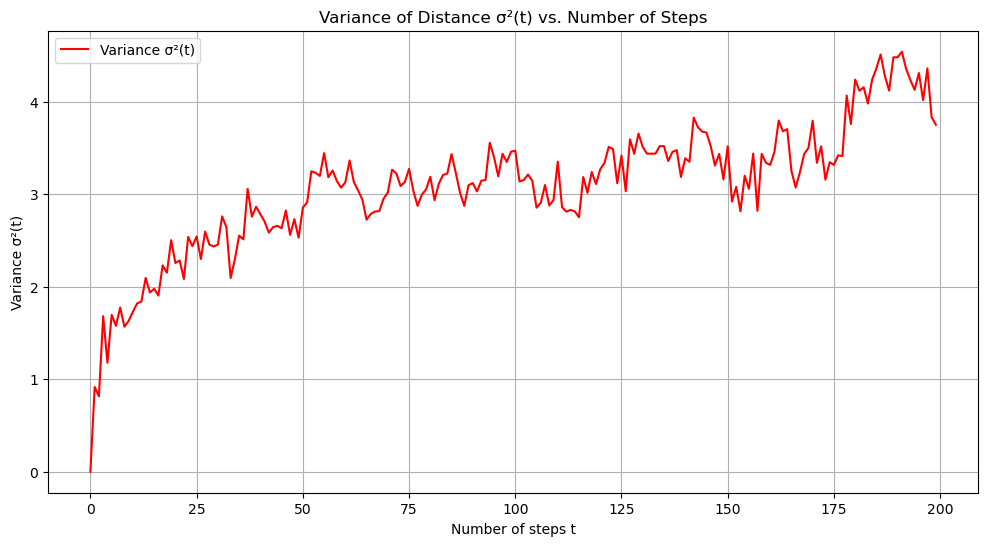

In [ ]:
# n = 90
n = 90
m = 1
num_walks = 200
max_steps = 200

g = ig.Graph.Barabasi(n=n, m=m)

def random_walk(graph, max_steps):
    start_node = np.random.choice(graph.vcount())
    current_node = start_node
    distances = []

    for _ in range(max_steps):
        neighbors = graph.neighbors(current_node)
        if neighbors:
            current_node = np.random.choice(neighbors)
        distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])

    return distances

all_distances = [random_walk(g, max_steps) for _ in range(num_walks)]

avg_distances = np.mean(all_distances, axis=0)
variances = np.var(all_distances, axis=0)

# Plotting average distances ⟨s(t)⟩ vs t
plt.figure(figsize=(12, 6))
plt.plot(range(max_steps), avg_distances, label='Average distance ⟨s(t)⟩', color='blue')
plt.xlabel('Number of steps t')
plt.ylabel('Average distance ⟨s(t)⟩')
plt.title('Average Distance ⟨s(t)⟩ vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

# Plotting variance σ²(t) vs t
plt.figure(figsize=(12, 6))
plt.plot(range(max_steps), variances, label='Variance σ²(t)', color='red')
plt.xlabel('Number of steps t')
plt.ylabel('Variance σ²(t)')
plt.title('Variance of Distance σ²(t) vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

/var/folders/f0/f6mb0ksn3flbsvtdd93lppk40000gp/T/ipykernel_37213/3342913062.py:18: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])


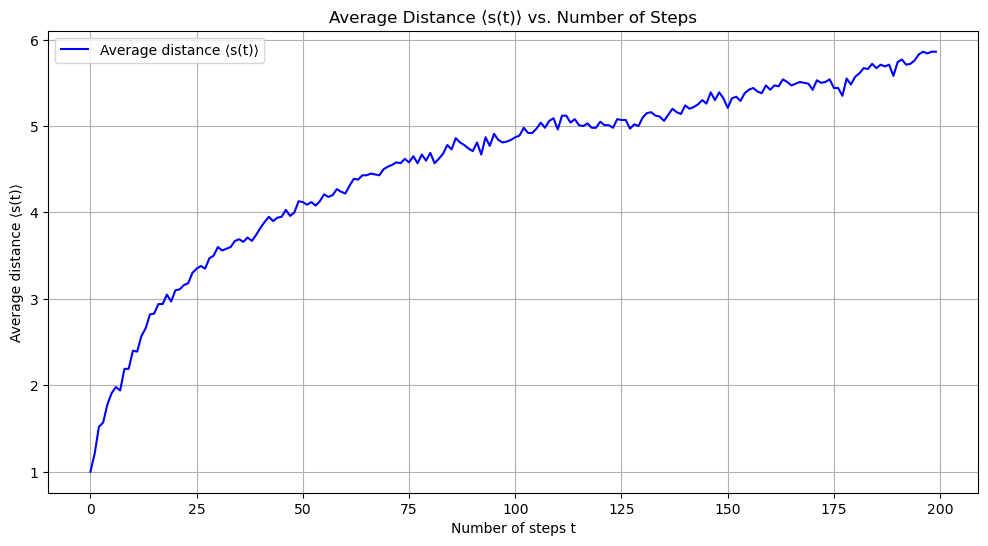

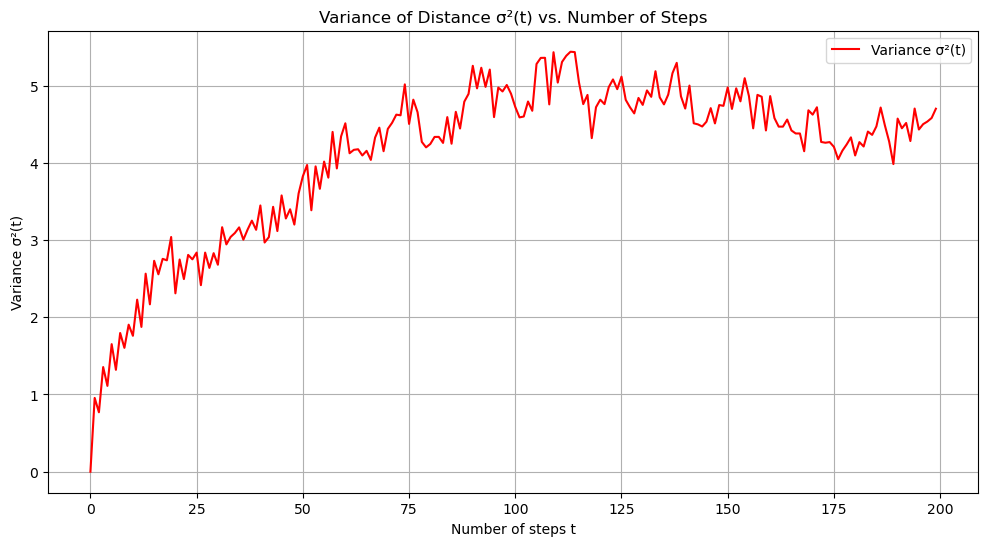

In [ ]:
# n = 9000
n = 9000
m = 1
num_walks = 200
max_steps = 200

g = ig.Graph.Barabasi(n=n, m=m)

def random_walk(graph, max_steps):
    start_node = np.random.choice(graph.vcount())
    current_node = start_node
    distances = []

    for _ in range(max_steps):
        neighbors = graph.neighbors(current_node)
        if neighbors:
            current_node = np.random.choice(neighbors)
        distances.append(graph.shortest_paths_dijkstra(start_node, current_node)[0][0])

    return distances

all_distances = [random_walk(g, max_steps) for _ in range(num_walks)]

avg_distances = np.mean(all_distances, axis=0)
variances = np.var(all_distances, axis=0)

# Plotting average distances ⟨s(t)⟩ vs t
plt.figure(figsize=(12, 6))
plt.plot(range(max_steps), avg_distances, label='Average distance ⟨s(t)⟩', color='blue')
plt.xlabel('Number of steps t')
plt.ylabel('Average distance ⟨s(t)⟩')
plt.title('Average Distance ⟨s(t)⟩ vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

# Plotting variance σ²(t) vs t
plt.figure(figsize=(12, 6))
plt.plot(range(max_steps), variances, label='Variance σ²(t)', color='red')
plt.xlabel('Number of steps t')
plt.ylabel('Variance σ²(t)')
plt.title('Variance of Distance σ²(t) vs. Number of Steps')
plt.legend()
plt.grid(True)
plt.show()

**<font color=blue size=4>Question 2(d)**

**Repeat 2(b) for preferential attachment networks with 90 and 9000 nodes, and m = 1.
Compare the results and explain qualitatively. Does the diameter of the network play
a role?**

We repeated the random walk on preferential attachment networks with 90 and 9000 nodes. You can see the results above. The average and variance of the number of visited nodes as a function of time are similar for all three networks. Yes, the diameter of the network plays a role. When the diameter of the network is large, the network size is also large. As the network size increases, the average and variance of the number of visited nodes as a function of time also increase.

## 3. PageRank

### Question 3(a)

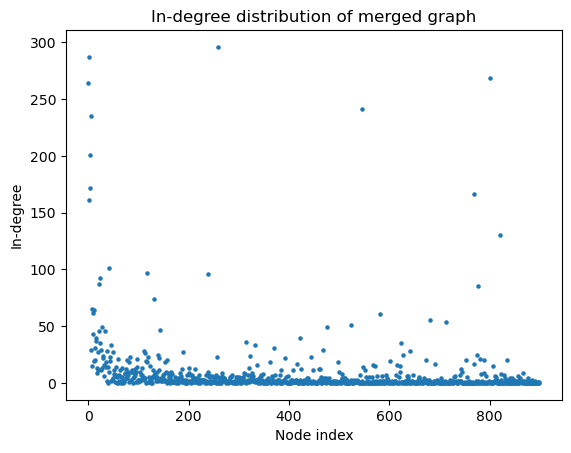

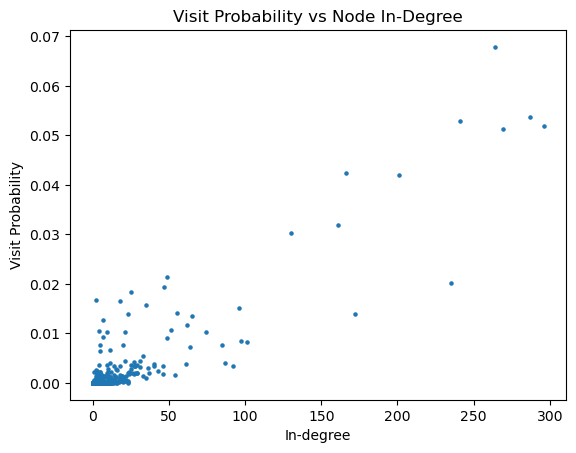

In [ ]:
n, m = 900, 4

g1 = ig.Graph.Barabasi(n=n, m=m, directed=True)
g2 = ig.Graph.Barabasi(n=n, m=m, directed=True)

def shuffle_and_merge_graphs(g1, g2):
    permuted_indices = np.random.permutation(g2.vcount())
    g2_permuted = g2.permute_vertices(permuted_indices)

    g1.add_edges(g2_permuted.get_edgelist())

def plot_degrees(g, title):
    degrees = g.indegree()
    plt.scatter(range(len(degrees)), degrees, s=5)
    plt.title(title)
    plt.xlabel('Node index')
    plt.ylabel('In-degree')
    plt.show()


def simulate_random_walks(g, iters=100, steps=1000):
    size = g.vcount()
    visit_prob = np.zeros(size)

    for _ in range(iters):
        visit_count = np.zeros(size)
        current_node = np.random.choice(size)

        for _ in range(steps):
            successors = g.successors(current_node)
            if successors:
                current_node = np.random.choice(successors)
            else:
                current_node = np.random.choice(size)
            visit_count[current_node] += 1

        visit_prob += visit_count / np.sum(visit_count)

    return visit_prob / iters


shuffle_and_merge_graphs(g1, g2)

plot_degrees(g1, 'In-degree distribution of merged graph')

visit_prob = simulate_random_walks(g1)
plt.scatter(g1.indegree(), visit_prob, s=5)
plt.xlabel('In-degree')
plt.ylabel('Visit Probability')
plt.title('Visit Probability vs Node In-Degree')
plt.show()


**<font color=blue size=4>Question 3(a)**

**We are going to create a directed random network with 900 nodes, using the preferential attachment model. Note that in a directed preferential attachment network, the
out-degree of every node is m, while the in-degrees follow a power law distribution.
One problem of performing random walk in such a network is that, the very first
node will have no outbounding edges, and be a “black hole” which a random walker
can never “escape” from. To address that, let’s generate another 900-node random
network with preferential attachment model, and merge the two networks by adding
the edges of the second graph to the first graph with a shuffling of the indices of the
nodes. Create such a network using m = 4. Measure the probability that the walker visits
each node. Is this probability related to the degree of the nodes?**

We created a directed random network with 900 nodes using the preferential attachment model. We merged two networks by adding the edges of the second graph to the first graph with a shuffling of the indices of the nodes. You can see the network above.

We also measured the probability that the walker visits each node. You can see the results above.

The probability that the walker visits each node is related to the degree of the nodes. The nodes with higher degrees have higher probabilities. There is a linear relationship between the probability that the walker visits each node and the degree of the nodes.

### Question 3(b)

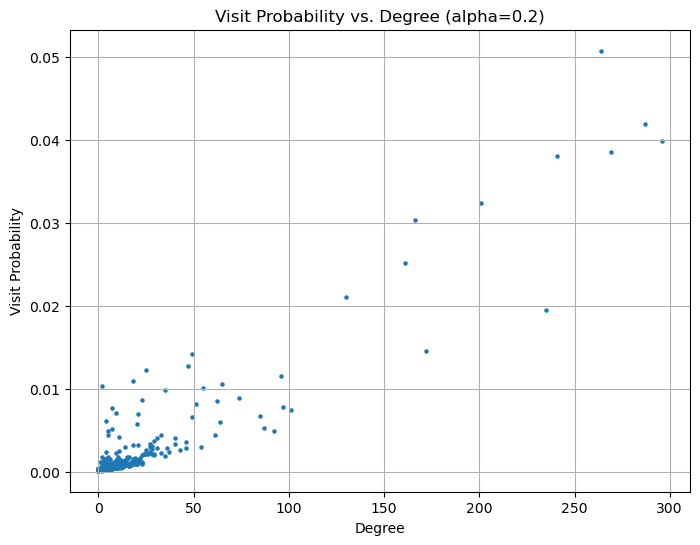

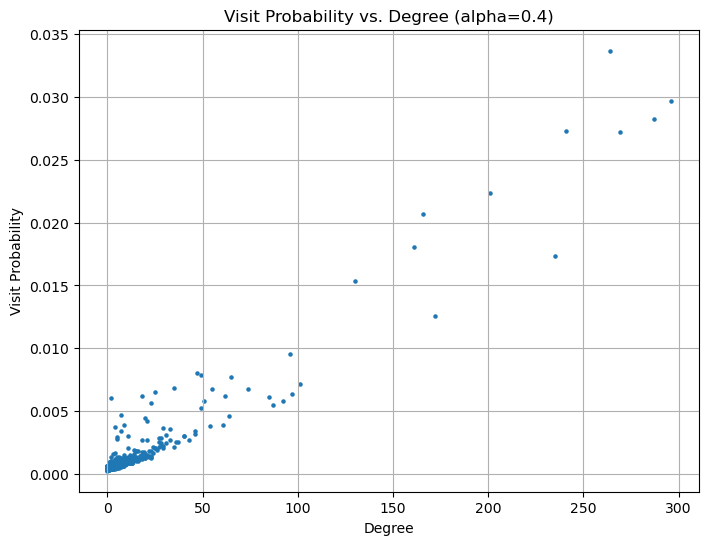

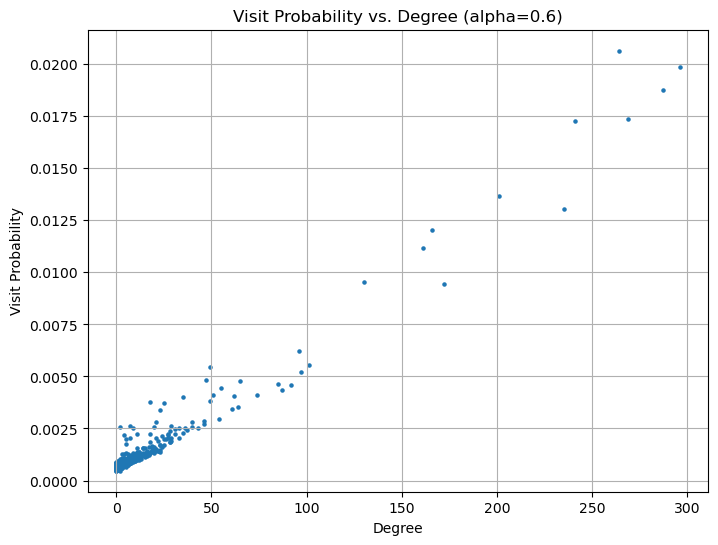

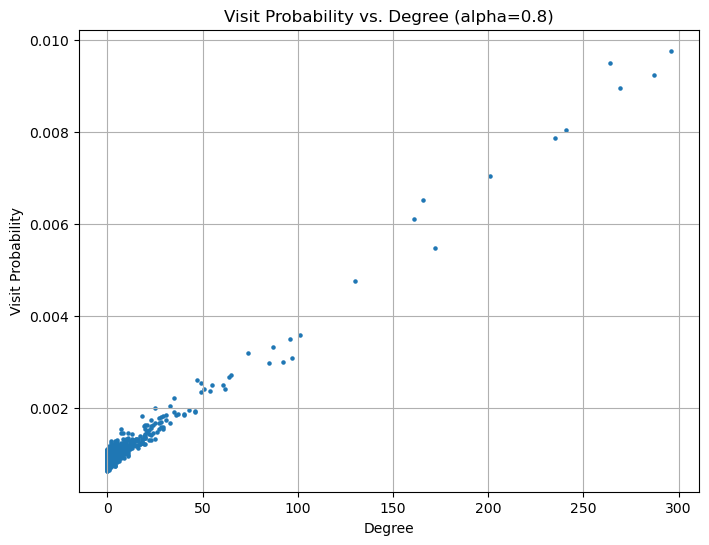

In [ ]:
def random_walk_with_teleportation(graph, size, steps, alpha):
    visit_count = np.zeros(size)
    current_node = np.random.choice(size)
    for _ in range(steps):
        visit_count[current_node] += 1
        neighbors = graph.successors(current_node)
        if np.random.rand() < alpha or len(neighbors) == 0:
            current_node = np.random.choice(size)
        else:
            current_node = np.random.choice(neighbors)
    return visit_count / steps

def run_simulation(graph, size, iters, steps, alphas):
    probabilities = np.zeros((len(alphas), size))
    for j, alpha in enumerate(alphas):
        for _ in range(iters):
            probabilities[j] += random_walk_with_teleportation(graph, size, steps, alpha)
        probabilities[j] /= iters
    return probabilities

def plot_results(degrees, probabilities, alphas):
    for index, alpha in enumerate(alphas):
        plt.figure(figsize=(8, 6))
        plt.scatter(degrees, probabilities[index], s=5)
        plt.xlabel('Degree')
        plt.ylabel('Visit Probability')
        plt.title(f'Visit Probability vs. Degree (alpha={alpha})')
        plt.grid(True)
        plt.show()

iters = 100
size = 900
steps = 1000
alphas = [0.2, 0.4, 0.6, 0.8]

degrees = g1.indegree()
probabilities = run_simulation(g1, size, iters, steps, alphas)
plot_results(degrees, probabilities, alphas)

**<font color=blue size=4>Question 3(b)**

**In all previous questions, we didn’t have any teleportation. Now, we use a teleportation probability of α = 0.2 (teleport out of a node with prob=0.2 instead of going to
its neighbor). By performing random walks on the network created in 3(a), measure
the probability that the walker visits each node. How is this probability related to
the degree of the node and α ?**

We performed random walks on the network created in 3(a) with a teleportation probability of α = 0.2. We measured the probability that the walker visits each node. You can see the results above.

The probability that the walker visits each node is related to the degree of the node and α. We performed the simulation of alpha = 0.2, 0.4, 0.6 and 0.8. The nodes with higher degrees have higher probabilities. The probability that the walker visits each node decreases with the teleportation probability alpha increasing.

## 4. Personalized PageRank


### Question 4(a)

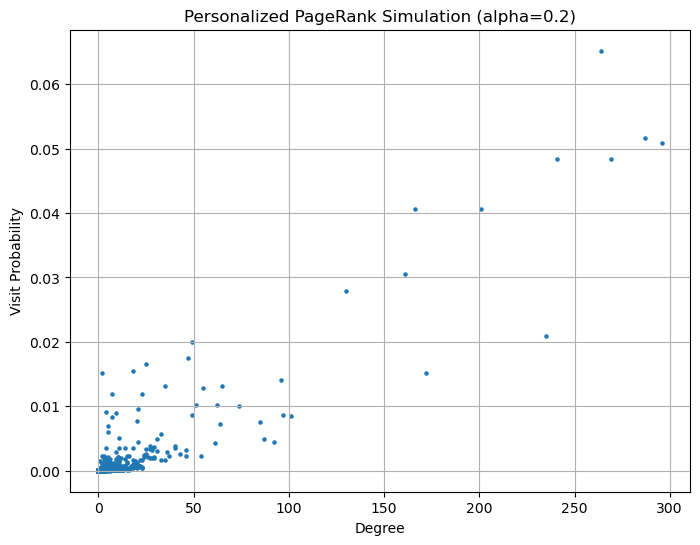

In [ ]:
def calculate_pagerank(graph):
    return np.array(graph.pagerank())

def random_walk_personalized(graph, size, steps, alpha, pagerank):
    visit_count = np.zeros(size)
    current_node = np.random.choice(size)
    teleport_distribution = np.random.choice(size, p=pagerank, size=steps)
    for i in range(steps):
        visit_count[current_node] += 1
        neighbors = graph.successors(current_node)
        if np.random.rand() < alpha or len(neighbors) == 0:
            current_node = teleport_distribution[i]
        else:
            current_node = np.random.choice(neighbors)
    return visit_count / steps

def run_simulation(graph, size, iters, steps, alpha):
    pagerank = calculate_pagerank(graph)
    probabilities = np.zeros(size)
    for _ in range(iters):
        probabilities += random_walk_personalized(graph, size, steps, alpha, pagerank)
    return probabilities / iters

def plot_results(degrees, probabilities):
    plt.figure(figsize=(8, 6))
    plt.scatter(degrees, probabilities, s=5)
    plt.xlabel('Degree')
    plt.ylabel('Visit Probability')
    plt.title(f'Personalized PageRank Simulation (alpha=0.2)')
    plt.grid(True)
    plt.show()

iters = 100
size = 900
steps = 1000
alpha = 0.2

degrees = g1.indegree()
probabilities = run_simulation(g1, size, iters, steps, alpha)
plot_results(degrees, probabilities)

**<font color=blue size=4>Question 4(a)**

**Suppose you have your own notion of importance. Your interest in a node is proportional to the node’s PageRank, because you totally rely upon Google to decide which
website to visit (assume that these nodes represent websites). Again, use random
walk on network generated in question 3 to simulate this personalized PageRank.
Here the teleportation probability to each node is proportional to its PageRank (as
opposed to the regular PageRank, where at teleportation, the chance of visiting all
nodes are the same and equal to 1
N
). Again, let the teleportation probability be
equal to α = 0.2. Compare the results with 3(a).**

We used random walk on the network generated in question 3 to simulate personalized PageRank. The teleportation probability to each node is proportional to its PageRank. We set the teleportation probability to be equal to α = 0.2. You can see the results above. Compared to 3(a), the simulation is very similar. We can see a similar relationship between the probability that the walker visits each node and the degree of the nodes. The nodes with higher degrees have higher probabilities.

### Question 4(b)

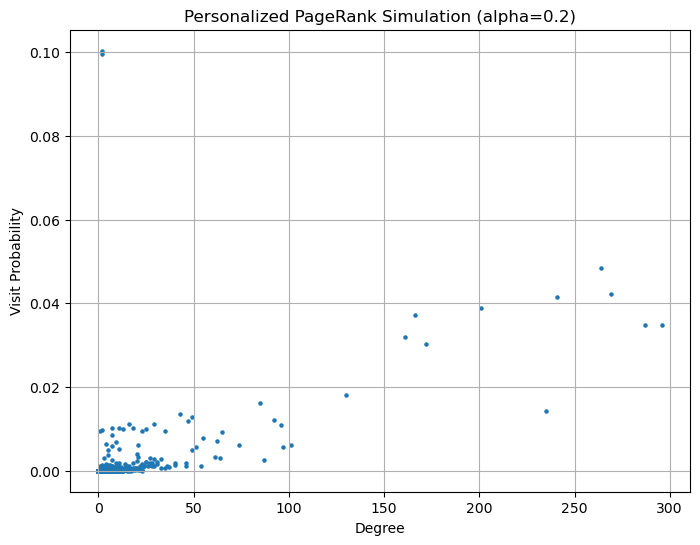

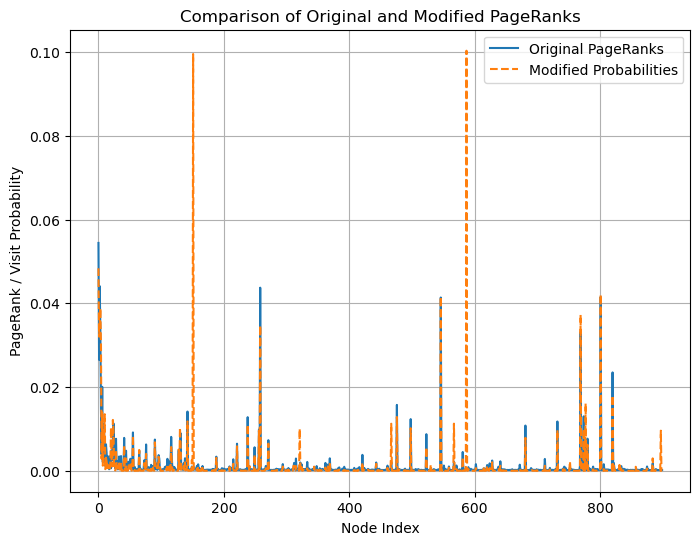

In [ ]:
def random_walk_two_medians(graph, size, steps, alpha, median_nodes):
    visit_count = np.zeros(size)
    current_node = np.random.choice(size)
    for _ in range(steps):
        visit_count[current_node] += 1
        neighbors = graph.successors(current_node)
        if np.random.rand() < alpha or len(neighbors) == 0:
            current_node = np.random.choice(median_nodes)
        else:
            current_node = np.random.choice(neighbors)
    return visit_count / steps

def run_simulation_two_medians(graph, size, iters, steps, alpha, median_nodes):
    probabilities = np.zeros(size)
    for _ in range(iters):
        probabilities += random_walk_two_medians(graph, size, steps, alpha, median_nodes)
    return probabilities / iters

iters = 100
size = 900
steps = 1000
alpha = 0.2

original_pageranks = calculate_pagerank(g1)

sorted_indices = np.argsort(original_pageranks)
idx1 = len(sorted_indices)//2 - 1
idx2 = len(sorted_indices)//2
median_index1, median_index2 = sorted_indices[idx1], sorted_indices[idx2]
median_nodes = [median_index1, median_index2]

modified_probabilities = run_simulation_two_medians(g1, size, iters, steps, alpha, median_nodes)
plot_results(degrees, modified_probabilities)


plt.figure(figsize=(8, 6))
plt.plot(original_pageranks, label='Original PageRanks')
plt.plot(modified_probabilities, label='Modified Probabilities', linestyle='--')
plt.xlabel('Node Index')
plt.ylabel('PageRank / Visit Probability')
plt.title('Comparison of Original and Modified PageRanks')
plt.legend()
plt.grid(True)
plt.show()

**<font color=blue size=4>Question 4(b)**

**Find two nodes in the network with median PageRanks. Repeat part 4(a) if teleportations land only on those two nodes (with probabilities 1/2, 1/2). How are the
PageRank values affected?**

We found two nodes in the network with median PageRanks. We repeated part 4(a) if teleportations land only on those two nodes (with probabilities 1/2, 1/2). You can see the results above.

The PageRank values are affected. You can see two outliers in the first plot, which are the two nodes with median PageRanks. We can see more nodes with lower PageRank values in the first plot. In the second plot, we can see two spikes, which are the two nodes with median PageRanks. The PageRank values of the nodes with median PageRanks are higher than the other nodes.

### Question 4(c)

**<font color=blue size=4>Question 4(c)**

**More or less, 4(b) is what happens in the real world, in that a user browsing the web
only teleports to a set of trusted web pages. However, this is against the assumption
of normal PageRank, where we assume that people’s interest in all nodes are the
same. Can you take into account the effect of this self-reinforcement and adjust the
PageRank equation?**

 Considering web browsing behavior, it's more pratical to account for users often favoring a subset of trusted pages, deviating from the classical PageRank assumption of uniform interest across all nodes. To integrate this concept, we take into account the effect of self-reinforcement by adjusting the PageRank equation.

The adjusted PageRank $P_{ij}$ for a node $j$ considering a set $T$ of trusted nodes is:

$$
P_{ij} = (1 - \alpha) \left( \frac{1}{k_{\text{out}}(i)} A_{ij} \right) + \alpha \frac{1}{|T|} B(j)
$$

where $B(j)$ is a bias function defined as:

$$
B(j) =
  \begin{cases}
   1 & \text{if } j \in T \\
   0 & \text{if } j \notin T
  \end{cases}
$$

The overall probability of visiting node after convergence, reflecting the page rank of is:

$$
\pi(j) = \sum_{i=1}^{n} P_{ij} \pi(i)
$$

$$
\pi(j) = (1 - \alpha) \sum_{i=1}^{n} \left( \frac{1}{k_{\text{out}}(i)} A_{ij} \pi(i) \right) + \alpha \frac{1}{|T|} B(j)
$$

This modified PageRank equation thus captures the increased likelihood of visiting trusted nodes, aligning the algorithm more closely with real-world web surfing behaviors.

In practical situations, such as in Problem 4 Part b, where $\frac{1}{|T|} = 0.5$ and $T$ is a set of median-ranked nodes, the random walker is predisposed towards these nodes, resulting in higher probabilities in the convergence of the algorithm for those particular nodes.

